# Installing and Setting up of Necessary Libaries

In [ ]:
!pip install faker

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 13.9 MB/s eta 0:00:00


# Pipeline

The diagram below explains the entire pipeline followed below. In the following cells, we explain the

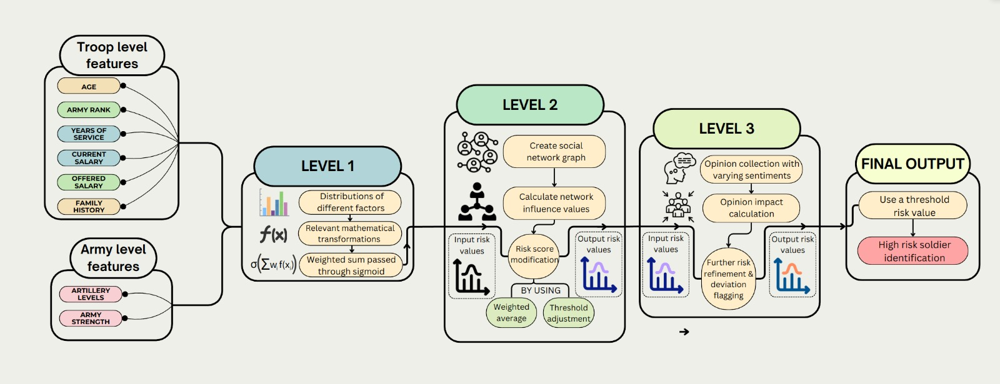

In [ ]:
import numpy as np
import pandas as pd
from scipy import stats
from faker import Faker
import seaborn as sns
import matplotlib.pyplot as plt

np.random.seed(42)
fake = Faker()

num_soldiers = 2000
enemy_army_strength = 2200

# Define distributions and parameters
age_mean, age_std = 35, 7
years_service_shape, years_service_scale = 2, 6
ranks = ['Private', 'Corporal', 'Sergeant', 'Lieutenant', 'Captain']
rank_probabilities = [0.55, 0.25, 0.12, 0.06, 0.02]

# Define base salaries and yearly increments for each rank
rank_salaries = {
    'Private': {'base': 30000, 'increment': 500},
    'Corporal': {'base': 40000, 'increment': 750},
    'Sergeant': {'base': 55000, 'increment': 1000},
    'Lieutenant': {'base': 70000, 'increment': 1500},
    'Captain': {'base': 90000, 'increment': 2000}
}

# Generate data
age = np.clip(stats.norm.rvs(age_mean, age_std, size=num_soldiers), 18, 60).astype(int)
years_service = np.clip(stats.gamma.rvs(years_service_shape, scale=years_service_scale, size=num_soldiers), 0, 40).astype(int)
rank = np.random.choice(ranks, num_soldiers, p=rank_probabilities)

def calculate_salary(rank, years):
    base = rank_salaries[rank]['base']
    increment = rank_salaries[rank]['increment']
    return int(base + (years * increment))

current_salary = np.array([calculate_salary(r, y) for r, y in zip(rank, years_service)])

data = {
    'soldier_id': range(1, num_soldiers + 1),
    'name': [fake.name() for _ in range(num_soldiers)],
    'age': age,
    'rank': rank,
    'years_service': years_service,
    'current_salary': current_salary,
    'family_members_in_army': np.random.randint(0, 4, num_soldiers),
    'enemy_salary_offer': current_salary * np.random.uniform(1.1, 1.5, num_soldiers)
}


df = pd.DataFrame(data)

df['years_service'] = np.minimum(df['age'] - 18, df['years_service'])
df['artillery_level'] = np.random.randint(1, 11, size=num_soldiers)
df['army_strength'] = num_soldiers
df['enemy_army_strength'] = enemy_army_strength


def calculate_risk(row):
    base_risk = 0.1  # Keep a low base risk

    age_factor = 1 - stats.norm.pdf(row['age'], loc=35, scale=5) * 10  # Stronger preference for middle-aged soldiers
    salary_factor = np.tanh((row['enemy_salary_offer'] - row['current_salary']) / row['current_salary']) * 0.3  # Reduced impact
    service_factor = np.exp(-row['years_service'] / 5)  # Exponential decay with service years
    family_factor = np.exp(-row['family_members_in_army']*3)  # Exponential decay with family members
    rank_factor = 1 - (ranks.index(row['rank']) / (len(ranks) - 1))
    strength_factor = row['enemy_army_strength'] / (row['army_strength'] + row['enemy_army_strength'])
    artillery_factor = 1 - (row['artillery_level'] / 10)

    risk = (
        base_risk +
        (0.10 * age_factor) +
        (0.15 * salary_factor) +
        (0.25 * service_factor) +
        (0.20 * family_factor) +
        (0.15 * rank_factor) +
        (0.10 * strength_factor) +
        (0.05 * artillery_factor)
    )

    noise = np.random.normal(0, 0.01)  # Adjust standard deviation (0.05) to control noise level
    risk += noise

    return np.clip(risk, 0.01, 0.99)

df['initial_risk'] = df.apply(calculate_risk, axis=1)

df.to_csv('level1_risk_data.csv', index=False)

In [ ]:
df.head()

,soldier_id,name,age,rank,years_service,current_salary,family_members_in_army,enemy_salary_offer,artillery_level,army_strength,enemy_army_strength,initial_risk
0,1,Ryan Kim,38,Corporal,5,43750,2,61771.826823,5,2000,2200,0.441905
1,2,James Gray,34,Corporal,8,46000,3,65024.225136,9,2000,2200,0.354611
2,3,Scott Payne,39,Private,1,30500,2,39885.217005,10,2000,2200,0.568156
3,4,Timothy Rodriguez,45,Private,11,35500,1,51232.917625,1,2000,2200,0.486705
4,5,Brendan Boyer,33,Corporal,15,52000,0,65340.664342,8,2000,2200,0.513672


In [ ]:
print("\nRank distribution:")
print(df['rank'].value_counts(normalize=True))

print("\nSalary statistics by rank:")
print(df.groupby('rank')['current_salary'].describe())

print("\nCorrelation between years of service and salary:")
print(df['years_service'].corr(df['current_salary']))

print("\nRisk score statistics:")
print(df['initial_risk'].describe())


Rank distribution:
rank
Private       0.5785
Corporal      0.2390
Sergeant      0.1100
Lieutenant    0.0565
Captain       0.0160
Name: proportion, dtype: float64

Salary statistics by rank:
             count           mean           std      min       25%       50%  \
rank                                                                           
Captain       32.0  114750.000000  12564.671414  94000.0  104000.0  114000.0   
Corporal     478.0   48863.493724   6025.414461  40000.0   44500.0   47500.0   
Lieutenant   113.0   87323.008850  11516.471192  70000.0   77500.0   86500.0   
Private     1157.0   35578.219533   4140.396310  30000.0   32500.0   34500.0   
Sergeant     220.0   66595.454545   7893.988076  55000.0   60000.0   65000.0   

                 75%       max  
rank                            
Captain     126000.0  138000.0  
Corporal     52000.0   70000.0  
Lieutenant   94000.0  130000.0  
Private      37500.0   50000.0  
Sergeant     71000.0   95000.0  

Correlation betw

In [ ]:
rank_risk_correlation = df['initial_risk'].corr(df['rank'].map({rank: i for i, rank in enumerate(ranks)}))
print(f"Correlation between rank and initial risk: {rank_risk_correlation:.4f}")

Correlation between rank and initial risk: -0.3327


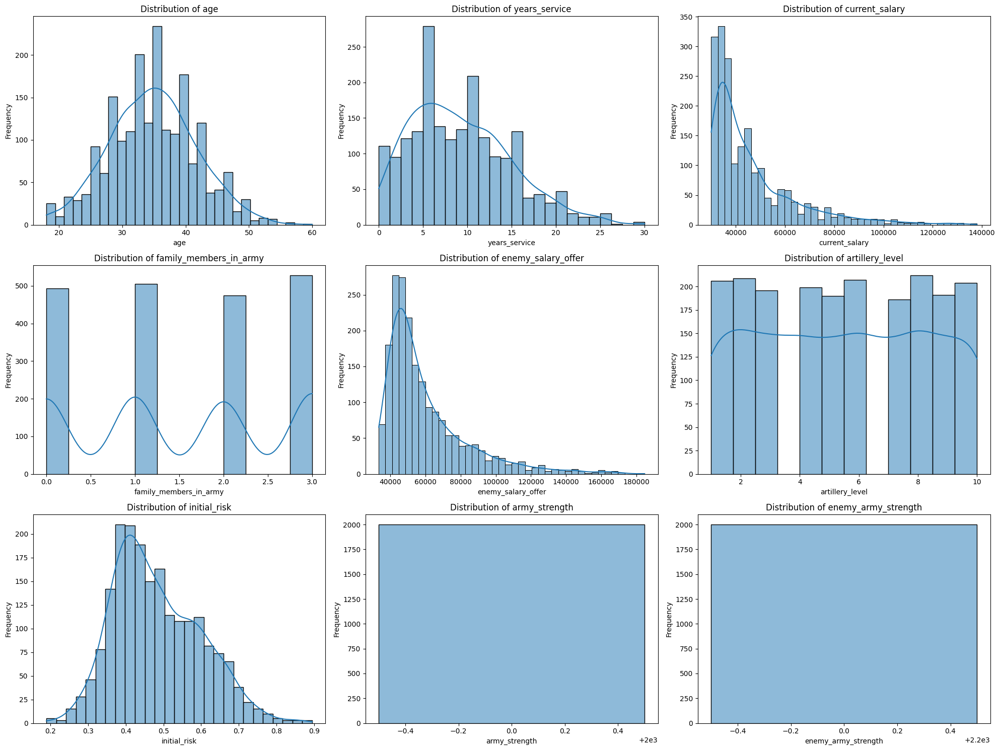

In [ ]:
# Visualizations
plt.figure(figsize=(20, 15))

features = ['age', 'years_service', 'current_salary', 'family_members_in_army',
            'enemy_salary_offer', 'artillery_level', 'initial_risk', 'army_strength', 'enemy_army_strength']
for i, feature in enumerate(features, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


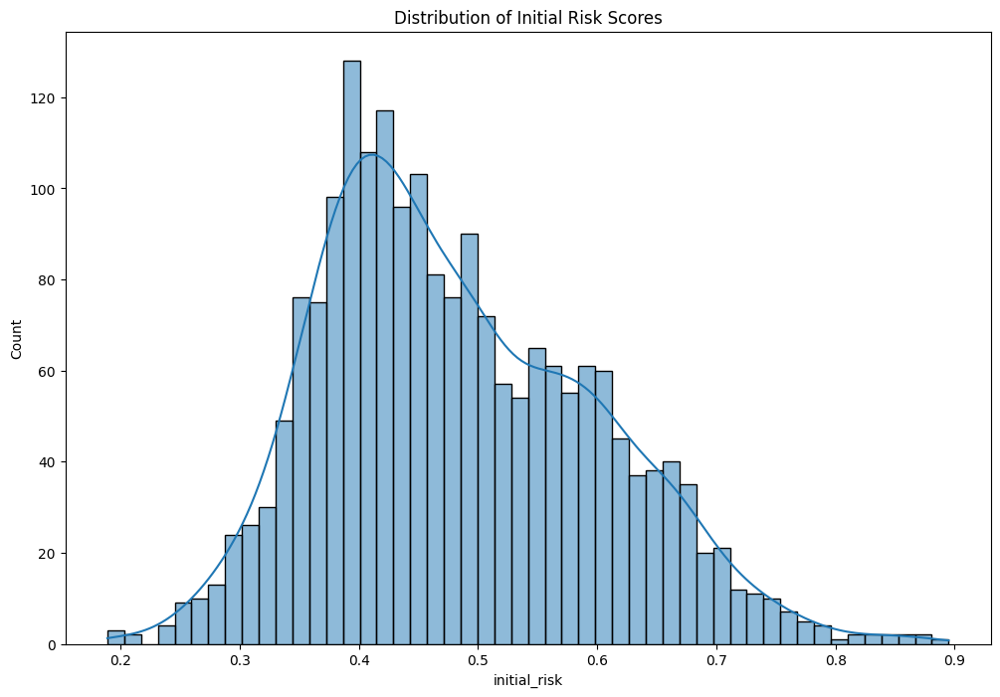

In [ ]:
plt.figure(figsize=(12, 8))
sns.histplot(data=df, x='initial_risk', kde=True, bins=50)
plt.title('Distribution of Initial Risk Scores')
plt.show()

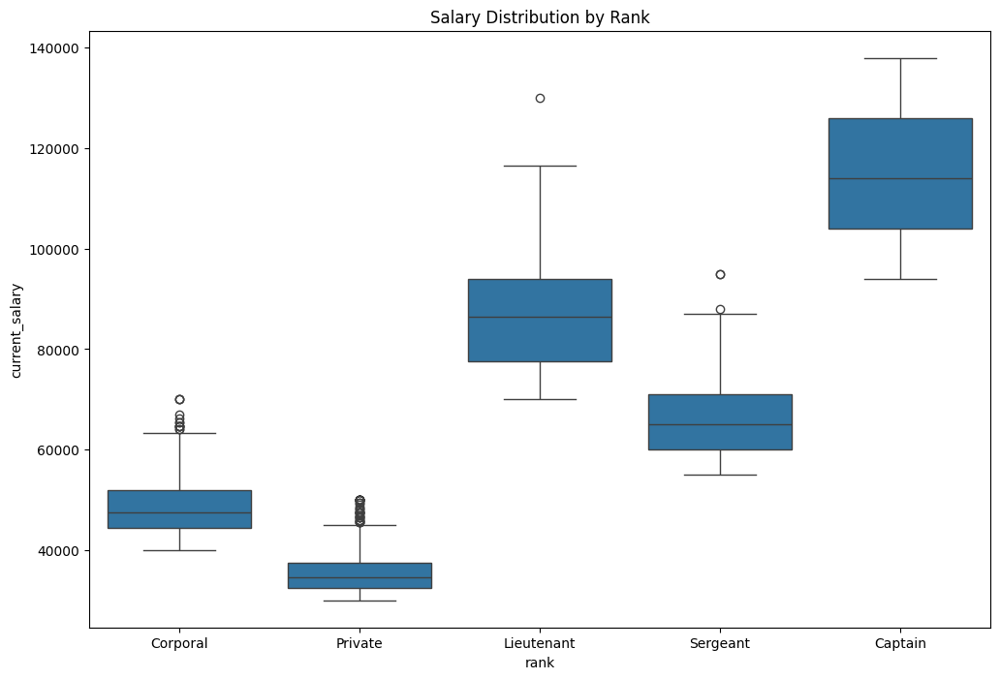

In [ ]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='rank', y='current_salary', data=df)
plt.title('Salary Distribution by Rank')
plt.show()

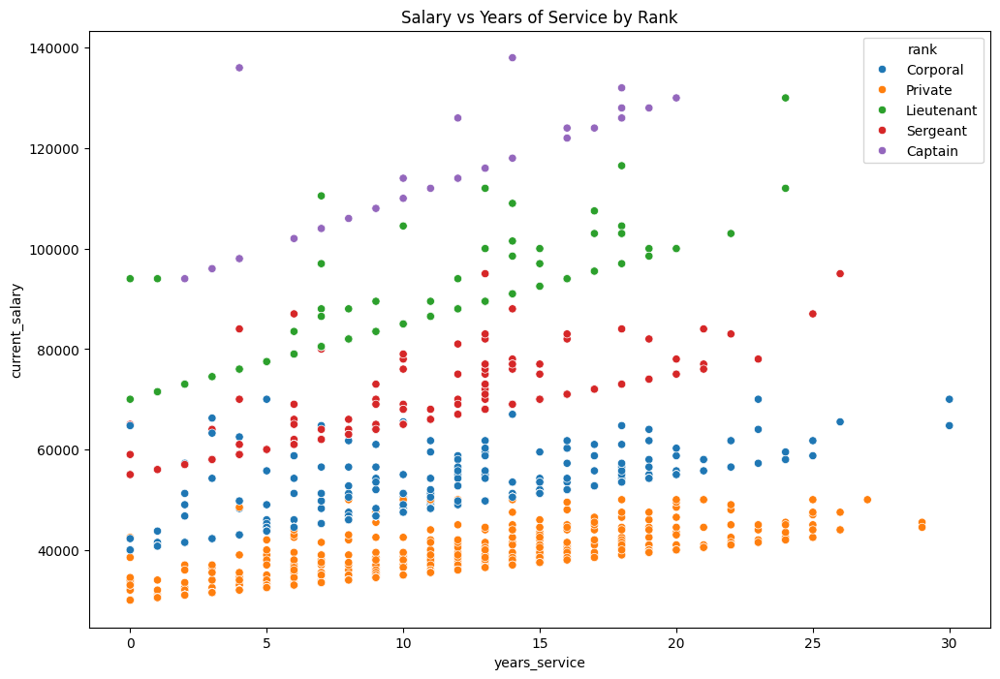

In [ ]:

plt.figure(figsize=(12, 8))
sns.scatterplot(x='years_service', y='current_salary', hue='rank', data=df)
plt.title('Salary vs Years of Service by Rank')
plt.show()


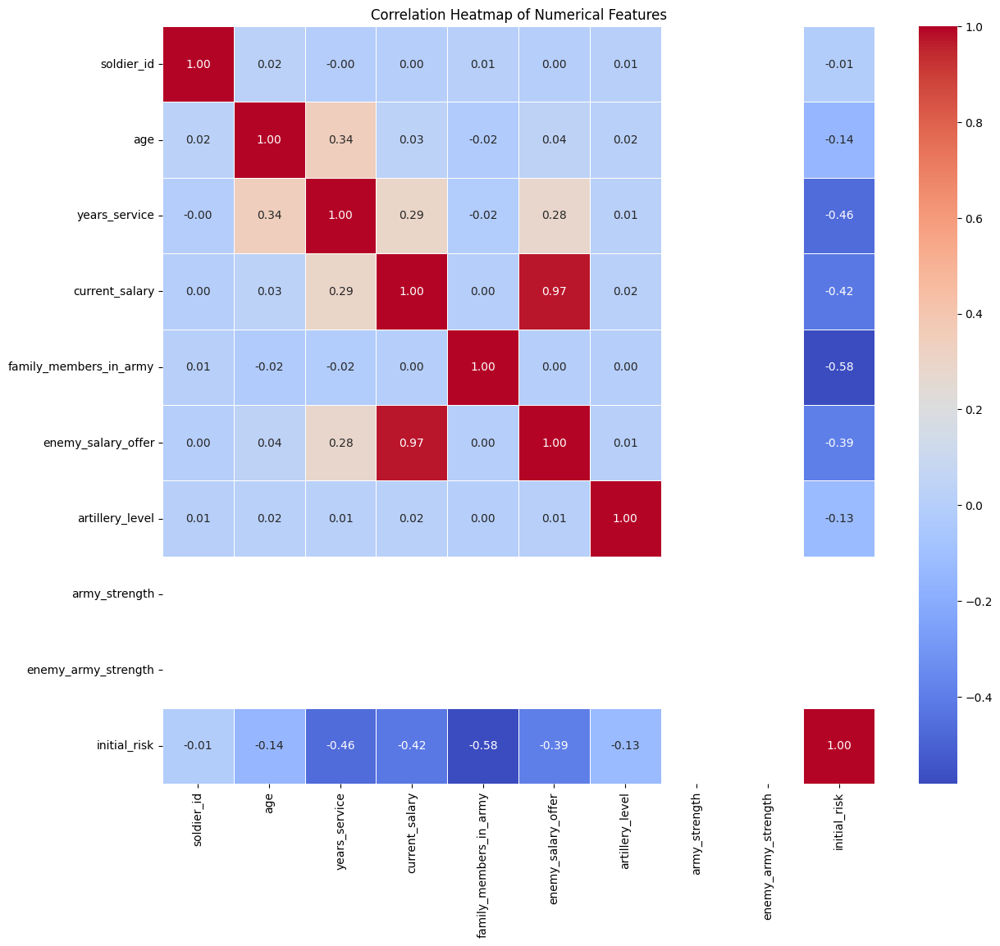

In [ ]:
# Correlation heatmap
plt.figure(figsize=(14, 12))
numeric_df = df.select_dtypes(include=[np.number])
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

In [ ]:
import networkx as nx
import numpy as np
import random

def create_rank_subgroups(df):
    """
    Create subgroups within each rank based on the dataframe from Level 1.

    :param df: DataFrame containing soldier data from Level 1
    :return: Dictionary with ranks as keys and lists of subgroups as values
    """
    rank_subgroups = {}
    for rank in df['rank'].unique():
        soldiers = df[df['rank'] == rank]['soldier_id'].tolist()
        num_subgroups = max(1, len(soldiers) // 100)  # Create a subgroup for every 100 soldiers
        subgroups = np.array_split(soldiers, num_subgroups)
        rank_subgroups[rank] = [subgroup.tolist() for subgroup in subgroups]
    return rank_subgroups

def assign_friendships(df, rank_subgroups, p_in=0.8, p_out_within_rank=0.2, p_out_across_ranks=0.05):
    """
    Generate a weighted friendship network with a hierarchical structure.

    :param df: DataFrame containing soldier data from Level 1
    :param rank_subgroups: Dictionary of rank subgroups
    :param p_in: Probability of friendships within the same subgroup
    :param p_out_within_rank: Probability of friendships between subgroups in the same rank
    :param p_out_across_ranks: Probability of friendships across ranks
    :return: A NetworkX graph representing weighted friendships
    """
    G = nx.Graph()

    # Add all soldiers as nodes
    G.add_nodes_from(df['soldier_id'])

    # Assign friendships within subgroups (high probability)
    for subgroups in rank_subgroups.values():
        for subgroup in subgroups:
            for i in range(len(subgroup)):
                for j in range(i + 1, len(subgroup)):
                    if random.random() < p_in:
                        weight = np.random.uniform(7, 10)
                        G.add_edge(subgroup[i], subgroup[j], weight=weight)

    # Assign friendships between subgroups within the same rank (moderate probability)
    for subgroups in rank_subgroups.values():
        for i in range(len(subgroups)):
            for j in range(i + 1, len(subgroups)):
                for u in subgroups[i]:
                    for v in subgroups[j]:
                        if random.random() < p_out_within_rank:
                            weight = np.random.uniform(3, 6)
                            G.add_edge(u, v, weight=weight)

    # Assign friendships across different ranks (lower probability)
    ranks = list(rank_subgroups.keys())
    for i in range(len(ranks)):
        for j in range(i + 1, len(ranks)):
            for subgroup_i in rank_subgroups[ranks[i]]:
                for subgroup_j in rank_subgroups[ranks[j]]:
                    for u in subgroup_i:
                        for v in subgroup_j:
                            if random.random() < p_out_across_ranks:
                                weight = np.random.uniform(1, 3)
                                G.add_edge(u, v, weight=weight)

    return G

# Generate the network
rank_subgroups = create_rank_subgroups(df)
friendship_network = assign_friendships(df, rank_subgroups)

print(f"Network generated with {friendship_network.number_of_nodes()} nodes and {friendship_network.number_of_edges()} edges.")

Network generated with 2000 nodes and 286645 edges.


In [ ]:
######### BASE APPROACH- mean converging

# import numpy as np
# import networkx as nx

# def calculate_network_influence(G, df, damping_factor=0.85, num_iterations=10):
#     """
#     Calculate the network influence on each soldier's risk score.

#     :param G: NetworkX graph representing the friendship network
#     :param df: DataFrame containing soldier data and initial risk scores
#     :param damping_factor: Factor to control the influence of the network (default: 0.85)
#     :param num_iterations: Number of iterations for the influence calculation (default: 10)
#     :return: Dictionary of soldier_id to network influence score
#     """
#     influence_scores = {node: df.loc[df['soldier_id'] == node, 'initial_risk'].values[0] for node in G.nodes()}

#     for _ in range(num_iterations):
#         new_scores = {}
#         for node in G.nodes():
#             neighbors = list(G.neighbors(node))
#             if neighbors:
#                 neighbor_score = sum(influence_scores[nei] * G[node][nei]['weight'] for nei in neighbors)
#                 neighbor_score /= sum(G[node][nei]['weight'] for nei in neighbors)
#                 new_scores[node] = (1 - damping_factor) * influence_scores[node] + damping_factor * neighbor_score
#             else:
#                 new_scores[node] = influence_scores[node]
#         influence_scores = new_scores

#     return influence_scores

# def modify_risk_scores(df, influence_scores, influence_weight=0.3):
#     """
#     Modify the initial risk scores based on network influence.

#     :param df: DataFrame containing soldier data and initial risk scores
#     :param influence_scores: Dictionary of soldier_id to network influence score
#     :param influence_weight: Weight given to the network influence (default: 0.3)
#     :return: DataFrame with modified risk scores
#     """
#     df['network_influence'] = df['soldier_id'].map(influence_scores)
#     df['modified_risk'] = (1 - influence_weight) * df['initial_risk'] + influence_weight * df['network_influence']

#     # Ensure the modified risk is within [0, 1]
#     df['modified_risk'] = df['modified_risk'].clip(0, 1)

#     return df

# # Calculate network influence
# influence_scores = calculate_network_influence(friendship_network, df)

# # Modify risk scores
# df = modify_risk_scores(df, influence_scores)

# print("Risk scores modified based on network influence.")
# print(f"Average initial risk: {df['initial_risk'].mean():.4f}")
# print(f"Average modified risk: {df['modified_risk'].mean():.4f}")

In [ ]:
# BASIC APPROACH - MEAN DIVERGING

# import numpy as np
# import networkx as nx

# def calculate_network_influence(G, df, damping_factor=0.85, num_iterations=10):
#     """
#     Calculate the network influence on each soldier's risk score.

#     :param G: NetworkX graph representing the friendship network
#     :param df: DataFrame containing soldier data and initial risk scores
#     :param damping_factor: Factor to control the influence of the network (default: 0.85)
#     :param num_iterations: Number of iterations for the influence calculation (default: 10)
#     :return: Dictionary of soldier_id to network influence score
#     """
#     influence_scores = {node: df.loc[df['soldier_id'] == node, 'initial_risk'].values[0] for node in G.nodes()}

#     for _ in range(num_iterations):
#         new_scores = {}
#         for node in G.nodes():
#             neighbors = list(G.neighbors(node))
#             if neighbors:
#                 neighbor_score = sum(influence_scores[nei] * G[node][nei]['weight'] for nei in neighbors)
#                 neighbor_score /= sum(G[node][nei]['weight'] for nei in neighbors)
#                 new_scores[node] = (1 - damping_factor) * influence_scores[node] + damping_factor * neighbor_score
#             else:
#                 new_scores[node] = influence_scores[node]
#         influence_scores = new_scores

#     return influence_scores

# def modify_risk_scores(df, G, threshold=0.5, max_adjustment=0.2):
#     """
#     Modify the initial risk scores based on network influence, using a threshold-based approach.

#     :param df: DataFrame containing soldier data and initial risk scores
#     :param G: NetworkX graph representing the friendship network
#     :param threshold: Threshold for determining positive/negative adjustment
#     :param max_adjustment: Maximum allowed adjustment (positive or negative)
#     :return: DataFrame with modified risk scores
#     """
#     def calculate_adjustment(node):
#         neighbors = list(G.neighbors(node))
#         if not neighbors:
#             return 0

#         avg_neighbor_risk = sum(df.loc[df['soldier_id'] == nei, 'initial_risk'].values[0] * G[node][nei]['weight']
#                                 for nei in neighbors) / sum(G[node][nei]['weight'] for nei in neighbors)

#         if avg_neighbor_risk > threshold:
#             return min(avg_neighbor_risk - threshold, max_adjustment)
#         else:
#             return max(avg_neighbor_risk - threshold, -max_adjustment)

#     df['risk_adjustment'] = df['soldier_id'].apply(calculate_adjustment)
#     df['modified_risk'] = df['initial_risk'] + df['risk_adjustment']

#     # Ensure the modified risk is within [0, 1]
#     df['modified_risk'] = df['modified_risk'].clip(0, 1)

#     return df

# # Apply the modified risk calculation
# df = modify_risk_scores(df, friendship_network)

# print("Risk scores modified based on network influence.")
# print(f"Average initial risk: {df['initial_risk'].mean():.4f}")
# print(f"Average modified risk: {df['modified_risk'].mean():.4f}")
# print(f"Average absolute risk adjustment: {df['risk_adjustment'].abs().mean():.4f}")

In [77]:
####### HYBRID APPROACH FOR REALISM


import numpy as np

def calculate_network_influence(G, df, damping_factor=0.85, num_iterations=10):
    """
    Calculate the network influence on each soldier's risk score.
    """
    influence_scores = {node: df.loc[df['soldier_id'] == node, 'initial_risk'].values[0] for node in G.nodes()}

    for _ in range(num_iterations):
        new_scores = {}
        for node in G.nodes():
            neighbors = list(G.neighbors(node))
            if neighbors:
                neighbor_score = sum(influence_scores[nei] * G[node][nei]['weight'] for nei in neighbors)
                neighbor_score /= sum(G[node][nei]['weight'] for nei in neighbors)
                new_scores[node] = (1 - damping_factor) * influence_scores[node] + damping_factor * neighbor_score
            else:
                new_scores[node] = influence_scores[node]
        influence_scores = new_scores

    return influence_scores

def modify_risk_scores(df, G, influence_scores, influence_weight=0.3, threshold=0.5, max_adjustment=0.1):
    """
    Modify the initial risk scores based on network influence, combining weighted average and threshold approaches.

    :param df: DataFrame containing soldier data and initial risk scores
    :param G: NetworkX graph representing the friendship network
    :param influence_scores: Dictionary of soldier_id to network influence score
    :param influence_weight: Weight given to the network influence (default: 0.3)
    :param threshold: Threshold for determining additional adjustment (default: 0.5)
    :param max_adjustment: Maximum allowed additional adjustment (default: 0.1)
    :return: DataFrame with modified risk scores
    """
    def calculate_threshold_adjustment(node):
        neighbors = list(G.neighbors(node))
        if not neighbors:
            return 0

        avg_neighbor_risk = sum(df.loc[df['soldier_id'] == nei, 'initial_risk'].values[0] * G[node][nei]['weight']
                                for nei in neighbors) / sum(G[node][nei]['weight'] for nei in neighbors)

        # Calculate adjustment based on threshold
        base_adjustment = avg_neighbor_risk - threshold

        # Scale adjustment based on rank (higher ranks are less affected)
        rank_factor = 1 - ranks.index(df.loc[df['soldier_id'] == node, 'rank'].values[0]) / len(ranks)

        return np.clip(base_adjustment * rank_factor, -max_adjustment, max_adjustment)

    df['network_influence'] = df['soldier_id'].map(influence_scores)

    # Weighted average approach
    df['base_modified_risk'] = (1 - influence_weight) * df['initial_risk'] + influence_weight * df['network_influence']

    # Threshold-based adjustment
    df['threshold_adjustment'] = df['soldier_id'].apply(calculate_threshold_adjustment)

    # Combine approaches
    df['modified_risk'] = df['base_modified_risk'] + df['threshold_adjustment']

    # Ensure the modified risk is within [0, 1]
    df['modified_risk'] = df['modified_risk'].clip(0, 1)

    return df

# Apply the modified risk calculation
influence_scores = calculate_network_influence(friendship_network, df)
df = modify_risk_scores(df, friendship_network, influence_scores)

print("Risk scores modified based on combined network influence approach.")
print(f"Average initial risk: {df['initial_risk'].mean():.4f}")
print(f"Average modified risk: {df['modified_risk'].mean():.4f}")
print(f"Average absolute risk adjustment: {(df['modified_risk'] - df['initial_risk']).abs().mean():.4f}")

Risk scores modified based on combined network influence approach.
Average initial risk: 0.4822
Average modified risk: 0.4764
Average absolute risk adjustment: 0.0282


In [ ]:
from scipy import stats

def plot_risk_distribution_comparison(df):
    """
    Plot the distribution of initial and modified risk scores.
    """
    plt.figure(figsize=(12, 6))
    sns.kdeplot(data=df, x='initial_risk', shade=True, label='Initial Risk')
    sns.kdeplot(data=df, x='modified_risk', shade=True, label='Modified Risk')
    plt.title('Distribution of Initial vs Modified Risk Scores')
    plt.xlabel('Risk Score')
    plt.ylabel('Density')
    plt.legend()
    plt.show()


def plot_risk_scatter(df):
    """
    Create a scatter plot of initial vs modified risk scores.
    """
    plt.figure(figsize=(10, 10))
    plt.scatter(df['initial_risk'], df['modified_risk'], alpha=0.5)
    plt.plot([0, 1], [0, 1], 'r--')  # Diagonal line
    plt.title('Initial Risk vs Modified Risk')
    plt.xlabel('Initial Risk')
    plt.ylabel('Modified Risk')
    plt.show()

def visualize_network(G, df, sample_size=1000):
    """
    Visualize a sample of the friendship network with node colors based on risk.
    """
    sample_nodes = np.random.choice(list(G.nodes()), sample_size, replace=False)
    subgraph = G.subgraph(sample_nodes)

    pos = nx.spring_layout(subgraph)

    plt.figure(figsize=(20, 20))
    node_colors = [df.loc[df['soldier_id'] == node, 'modified_risk'].values[0] for node in subgraph.nodes()]

    nx.draw_networkx_nodes(subgraph, pos, node_size=50, node_color=node_colors, cmap=plt.cm.viridis)
    nx.draw_networkx_edges(subgraph, pos, alpha=0.1)

    plt.title(f'Friendship Network Sample (n={sample_size})')
    plt.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.viridis), label='Modified Risk Score')
    plt.axis('off')
    plt.show()

def visualize_network_by_rank(G, df, sample_size=1000):
    """
    Visualize a sample of the friendship network with node colors based on rank.
    """
    sample_nodes = np.random.choice(list(G.nodes()), sample_size, replace=False)
    subgraph = G.subgraph(sample_nodes)

    pos = nx.spring_layout(subgraph)

    plt.figure(figsize=(20, 20))

    # Create a color map for ranks
    ranks = df['rank'].unique()
    color_map = plt.cm.get_cmap('tab10')
    rank_colors = {rank: color_map(i/len(ranks)) for i, rank in enumerate(ranks)}

    node_colors = [rank_colors[df.loc[df['soldier_id'] == node, 'rank'].values[0]] for node in subgraph.nodes()]

    nx.draw_networkx_nodes(subgraph, pos, node_size=50, node_color=node_colors)
    nx.draw_networkx_edges(subgraph, pos, alpha=0.1)

    # Create a legend
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=rank,
                       markerfacecolor=color, markersize=10) for rank, color in rank_colors.items()]
    plt.legend(handles=legend_elements, title='Rank', loc='center left', bbox_to_anchor=(1, 0.5))

    plt.title(f'Friendship Network by Rank (Sample Size: {sample_size})')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def visualize_risk_change_network(G, df, sample_size=1000):
    """
    Visualize a sample of the friendship network with node colors based on risk change.
    """
    sample_nodes = np.random.choice(list(G.nodes()), sample_size, replace=False)
    subgraph = G.subgraph(sample_nodes)

    pos = nx.spring_layout(subgraph)

    plt.figure(figsize=(20, 20))

    df['risk_change'] = df['modified_risk'] - df['initial_risk']
    node_colors = [df.loc[df['soldier_id'] == node, 'risk_change'].values[0] for node in subgraph.nodes()]

    vmin, vmax = df['risk_change'].min(), df['risk_change'].max()
    norm = plt.Normalize(vmin, vmax)

    nx.draw_networkx_nodes(subgraph, pos, node_size=50, node_color=node_colors, cmap=plt.cm.RdYlGn_r, norm=norm)
    nx.draw_networkx_edges(subgraph, pos, alpha=0.1)

    sm = plt.cm.ScalarMappable(cmap=plt.cm.RdYlGn_r, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm)
    cbar.set_label('Risk Change (Modified - Initial)')

    plt.title(f'Risk Change Network Visualization (Sample Size: {sample_size})')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def plot_risk_by_rank(df):
    """
    Plot boxplots of modified risk scores for each rank.
    """
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='rank', y='modified_risk', data=df)
    plt.title('Modified Risk Scores by Rank')
    plt.xlabel('Rank')
    plt.ylabel('Modified Risk Score')
    plt.show()

def plot_risk_change_distribution(df):
    """
    Plot the distribution of risk score changes.
    """
    df['risk_change'] = df['modified_risk'] - df['initial_risk']
    plt.figure(figsize=(12, 6))
    sns.histplot(data=df, x='risk_change', kde=True)
    plt.title('Distribution of Risk Score Changes')
    plt.xlabel('Risk Score Change (Modified - Initial)')
    plt.ylabel('Count')
    plt.show()

<ipython-input-15-98b6759b88be>:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=df, x='initial_risk', shade=True, label='Initial Risk')
<ipython-input-15-98b6759b88be>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=df, x='modified_risk', shade=True, label='Modified Risk')


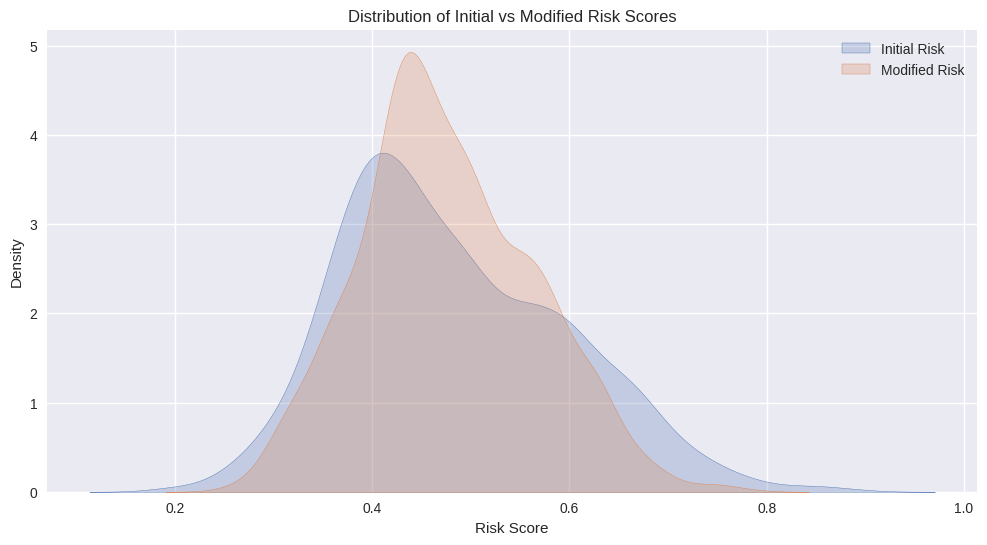

In [75]:

# Execute visualizations
plot_risk_distribution_comparison(df)

In [ ]:
plot_risk_scatter(df)

In [ ]:
visualize_network(friendship_network, df)

In [ ]:
plot_risk_by_rank(df)

In [ ]:
plot_risk_change_distribution(df)

In [73]:
# Additional statistical analysis
print("Correlation between initial and modified risk scores:",
      df['initial_risk'].corr(df['modified_risk']))

print("\nAverage risk change by rank:")
print(df.groupby('rank')['risk_change'].mean())

print("\nProportion of soldiers with increased risk:")
print((df['risk_change'] > 0).mean())

Correlation between initial and modified risk scores: 0.9765416835927114

Average risk change by rank:
rank
Captain       0.025704
Corporal     -0.018400
Lieutenant   -0.010837
Private       0.001925
Sergeant     -0.020700
Name: risk_change, dtype: float64

Proportion of soldiers with increased risk:
0.5


In [74]:
# Identify soldiers with the most significant risk changes
top_increased = df.nlargest(10, 'risk_change')
top_decreased = df.nsmallest(10, 'risk_change')

print("\nTop 10 soldiers with the largest risk increase:")
print(top_increased[['soldier_id', 'rank', 'initial_risk', 'modified_risk', 'risk_change']])

print("\nTop 10 soldiers with the largest risk decrease:")
print(top_decreased[['soldier_id', 'rank', 'initial_risk', 'modified_risk', 'risk_change']])


Top 10 soldiers with the largest risk increase:
      soldier_id     rank  initial_risk  modified_risk  risk_change
1038        1039  Captain      0.199450       0.268749     0.069300
450          451  Captain      0.205133       0.273689     0.068556
453          454  Captain      0.189000       0.257208     0.068208
237          238  Captain      0.203755       0.269565     0.065809
616          617  Private      0.353532       0.415573     0.062041
1221        1222  Private      0.344322       0.405612     0.061289
1475        1476  Captain      0.231957       0.292829     0.060872
68            69  Private      0.341108       0.401383     0.060274
555          556  Captain      0.236432       0.296513     0.060080
716          717  Private      0.321758       0.380659     0.058901

Top 10 soldiers with the largest risk decrease:
      soldier_id        rank  initial_risk  modified_risk  risk_change
955          956    Sergeant      0.778415       0.655238    -0.123177
908         

<ipython-input-15-98b6759b88be>:62: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('tab10')


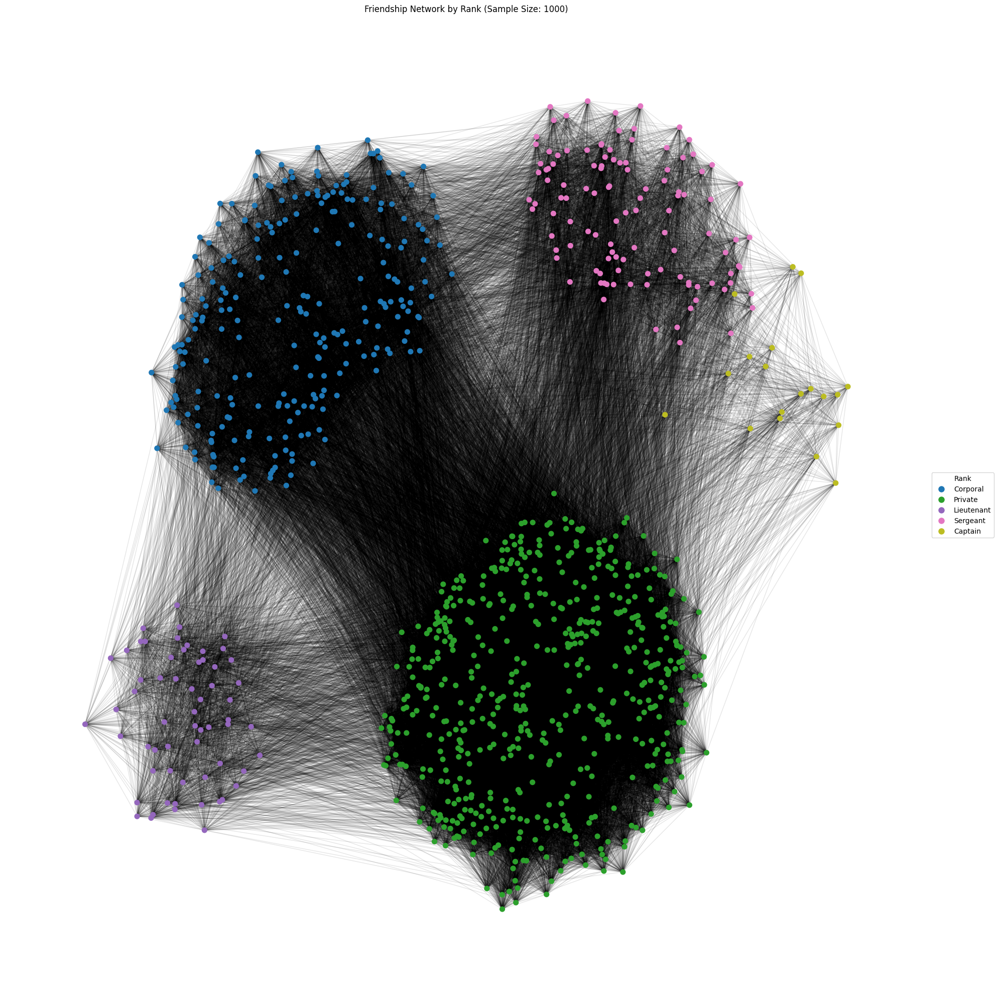

In [ ]:
visualize_network_by_rank(friendship_network, df)

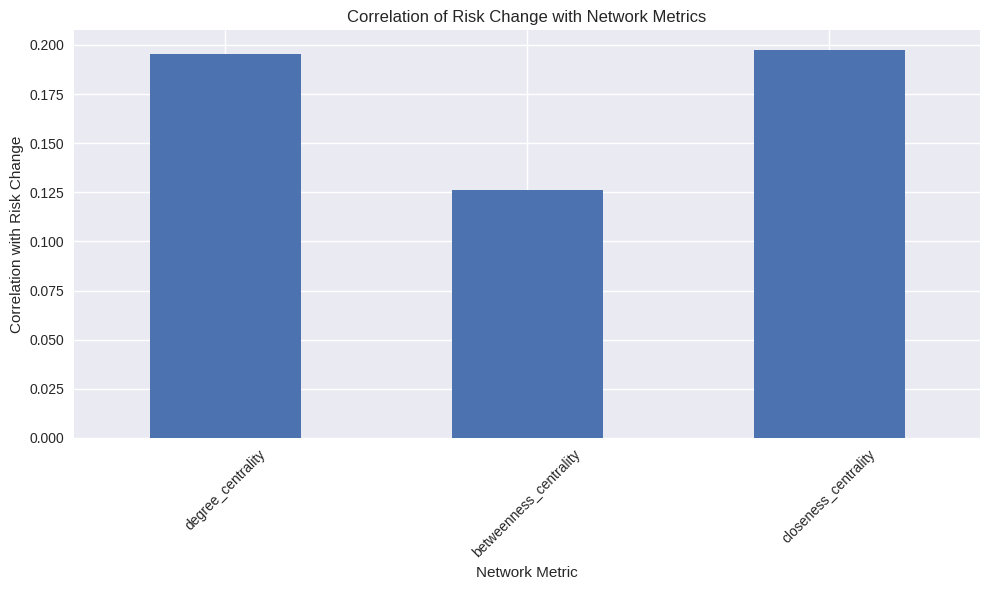

Correlations of Risk Change with Network Metrics:
degree_centrality         0.195223
betweenness_centrality    0.126338
closeness_centrality      0.197553
Name: risk_change, dtype: float64


In [72]:
# Additional analysis: Risk change correlation with network metrics
def analyze_risk_change_vs_network_metrics(G, df):
    """
    Analyze the correlation between risk change and various network metrics.
    """
    # Calculate network metrics
    degree_centrality = nx.degree_centrality(G)
    betweenness_centrality = nx.betweenness_centrality(G)
    closeness_centrality = nx.closeness_centrality(G)

    # Add network metrics to the dataframe
    df['degree_centrality'] = df['soldier_id'].map(degree_centrality)
    df['betweenness_centrality'] = df['soldier_id'].map(betweenness_centrality)
    df['closeness_centrality'] = df['soldier_id'].map(closeness_centrality)

    # Calculate correlations
    correlations = df[['risk_change', 'degree_centrality', 'betweenness_centrality', 'closeness_centrality']].corr()['risk_change'].drop('risk_change')

    # Plot correlations
    plt.figure(figsize=(10, 6))
    correlations.plot(kind='bar')
    plt.title('Correlation of Risk Change with Network Metrics')
    plt.xlabel('Network Metric')
    plt.ylabel('Correlation with Risk Change')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    print("Correlations of Risk Change with Network Metrics:")
    print(correlations)

# Execute the additional analysis
analyze_risk_change_vs_network_metrics(friendship_network, df)

In [ ]:
import random
from collections import defaultdict

# Define opinion statements with sentiment values (unchanged)
positive_opinions = [
    ("I trust them completely", 1.0),
    ("They're incredibly loyal", 0.9),
    ("They always put the team first", 0.8),
    ("They have a strong sense of duty", 0.7),
    ("They're reliable in tough situations", 0.6),
    ("They show great potential", 0.5),
    ("They're improving every day", 0.4),
    ("They work well with others", 0.3),
    ("They follow orders well", 0.2),
    ("They're punctual and disciplined", 0.1)
]

negative_opinions = [
    ("I don't trust them at all", -1.0),
    ("They seem disloyal", -0.9),
    ("They often complain about our mission", -0.8),
    ("They lack discipline", -0.7),
    ("They're unreliable under pressure", -0.6),
    ("They show little commitment", -0.5),
    ("They struggle to follow orders", -0.4),
    ("They don't work well in a team", -0.3),
    ("They're often late or unprepared", -0.2),
    ("They seem disinterested in their duties", -0.1)
]

def generate_opinions_optimized(df, G, k=4, opinion_count=30):
    """Generate a limited number of opinions for each soldier"""
    opinions = []
    soldier_risks = dict(zip(df['soldier_id'], df['modified_risk']))

    for giver_id in df['soldier_id']:
        giver_risk = soldier_risks[giver_id]
        friends = list(nx.single_source_shortest_path_length(G, giver_id, cutoff=k).items())

        # Randomly select a limited number of friends to give opinions about
        selected_friends = random.sample(friends, min(opinion_count, len(friends)))

        for receiver_id, degree in selected_friends:
            if receiver_id == giver_id:
                continue

            receiver_risk = soldier_risks[receiver_id]

            if random.random() < 0.75:  # 75% chance the opinion aligns with risk scores
                opinion, sentiment = random.choice(negative_opinions if giver_risk < receiver_risk else positive_opinions)
            else:  # 25% chance for a random opinion
                opinion, sentiment = random.choice(positive_opinions + negative_opinions)

            opinions.append({
                'giver_id': giver_id,
                'receiver_id': receiver_id,
                'opinion': opinion,
                'sentiment': sentiment,
                'degree': degree
            })

    return pd.DataFrame(opinions)



In [68]:
# Generate opinions
opinions_df = generate_opinions_optimized(df, friendship_network, k=3, opinion_count=10)

print(f"Generated {len(opinions_df)} opinions")
print(opinions_df.head())

Generated 19990 opinions
   giver_id  receiver_id                           opinion  sentiment  degree
0         1           97        They work well with others        0.3       2
1         1          367  They're punctual and disciplined        0.1       2
2         1          573           I trust them completely        1.0       1
3         1         1571           I trust them completely        1.0       2
4         1         1216                They seem disloyal       -0.9       2


In [69]:
# Additional analysis
print("\nOpinion distribution:")
print(opinions_df['sentiment'].describe())


Opinion distribution:
count    19990.000000
mean         0.005208
std          0.620193
min         -1.000000
25%         -0.500000
50%          0.100000
75%          0.600000
max          1.000000
Name: sentiment, dtype: float64


In [70]:
print("\nAverage sentiment by degree:")
print(opinions_df.groupby('degree')['sentiment'].mean())


Average sentiment by degree:
degree
1    0.009411
2    0.004503
Name: sentiment, dtype: float64


In [ ]:
# Save opinions to CSV for further analysis if needed
opinions_df.to_csv('soldier_opinions.csv', index=False)


In [ ]:
# Section 2: Risk Score Modification based on Opinions

def calculate_opinion_impact(opinions_df, df, alpha=0.1, scaling_factor=0.1):
    """Calculate the impact of opinions on risk scores"""
    impact = defaultdict(float)
    confidence = defaultdict(int)

    for _, row in opinions_df.iterrows():
        giver_risk = df.loc[df['soldier_id'] == row['giver_id'], 'modified_risk'].values[0]
        base_weight = 1 / row['degree']
        closeness_factor = alpha * base_weight
        weight = (base_weight + closeness_factor) * (1 - giver_risk)

        impact[row['receiver_id']] += row['sentiment'] * weight * scaling_factor
        confidence[row['receiver_id']] += 1

    return impact, confidence

def flag_significant_deviations(opinions_df, threshold=1.5):
    """Flag opinions that significantly deviate from the expected sentiment"""
    avg_sentiment = opinions_df.groupby('receiver_id')['sentiment'].mean()
    std_sentiment = opinions_df.groupby('receiver_id')['sentiment'].std()

    flags = defaultdict(list)
    for _, row in opinions_df.iterrows():
        z_score = (row['sentiment'] - avg_sentiment[row['receiver_id']]) / std_sentiment[row['receiver_id']]
        if abs(z_score) > threshold:
            flags[row['receiver_id']].append(f"Significant deviation from {row['giver_id']}")

    return flags

In [ ]:
# Calculate opinion impact and confidence
opinion_impact, opinion_confidence = calculate_opinion_impact(opinions_df, df)

In [ ]:
# Flag significant deviations
deviation_flags = flag_significant_deviations(opinions_df)

In [ ]:
# Modify risk scores based on opinions
df['opinion_impact'] = df['soldier_id'].map(opinion_impact)
df['opinion_confidence'] = df['soldier_id'].map(opinion_confidence)
df['final_risk'] = (df['modified_risk'] - 0.2*df['opinion_impact']).clip(0, 1)
df['risk_flags'] = df['soldier_id'].map(deviation_flags)


In [71]:
print("\nFinal risk score statistics:")
print(df['final_risk'].describe())

print("\nOpinion confidence statistics:")
print(df['opinion_confidence'].describe())

print("\nSample of soldiers with deviation flags:")
print(df[df['risk_flags'].astype(bool)].sample(min(5, df['risk_flags'].astype(bool).sum()))[['soldier_id', 'final_risk', 'risk_flags']])

# Save the final results
df.to_csv('final_risk_assessment.csv', index=False)


Final risk score statistics:
count    2000.000000
mean        0.479399
std         0.104055
min         0.228127
25%         0.406491
50%         0.469803
75%         0.551359
max         0.819803
Name: final_risk, dtype: float64

Opinion confidence statistics:
count    2000.000000
mean        9.994000
std         3.199544
min         2.000000
25%         8.000000
50%        10.000000
75%        12.000000
max        22.000000
Name: opinion_confidence, dtype: float64

Sample of soldiers with deviation flags:
      soldier_id  final_risk  \
1309        1310    0.532909   
1993        1994    0.482371   
1711        1712    0.411791   
1004        1005    0.590867   
1782        1783    0.504473   

                                             risk_flags  
1309  [Significant deviation from 170, Significant d...  
1993                  [Significant deviation from 1383]  
1711                    [Significant deviation from 67]  
1004                   [Significant deviation from 811]  
178

<ipython-input-57-cd549ed18d20>:9: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')
<ipython-input-57-cd549ed18d20>:14: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=df, x='initial_risk', shade=True, label='Level 1 (Initial)')
<ipython-input-57-cd549ed18d20>:15: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=df, x='modified_risk', shade=True, label='Level 2 (Network)')
<ipython-input-57-cd549ed18d20>:16: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True

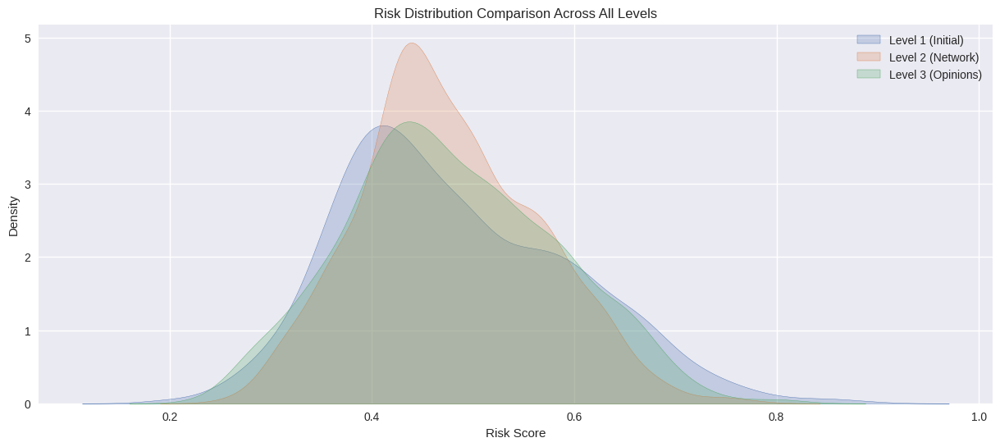

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import pandas as pd
import numpy as np
from scipy import stats

# Set the style for all plots
plt.style.use('seaborn')
sns.set_palette("deep")

# 1. Risk Distribution Comparison Across All Levels
plt.figure(figsize=(15, 6))
sns.kdeplot(data=df, x='initial_risk', shade=True, label='Level 1 (Initial)')
sns.kdeplot(data=df, x='modified_risk', shade=True, label='Level 2 (Network)')
sns.kdeplot(data=df, x='final_risk', shade=True, label='Level 3 (Opinions)')
plt.title('Risk Distribution Comparison Across All Levels')
plt.xlabel('Risk Score')
plt.ylabel('Density')
plt.legend()
plt.show()

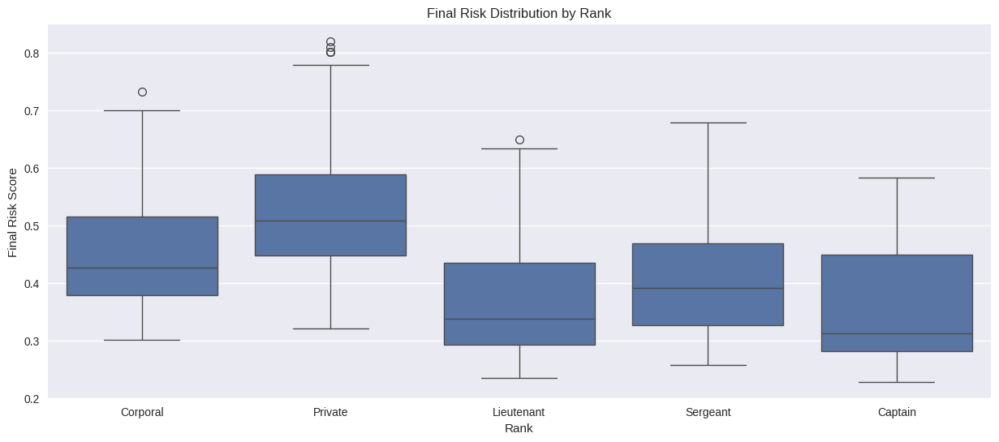

In [58]:
# 2. Rank-wise Risk Distribution
plt.figure(figsize=(15, 6))
sns.boxplot(x='rank', y='final_risk', data=df)
plt.title('Final Risk Distribution by Rank')
plt.xlabel('Rank')
plt.ylabel('Final Risk Score')
plt.show()

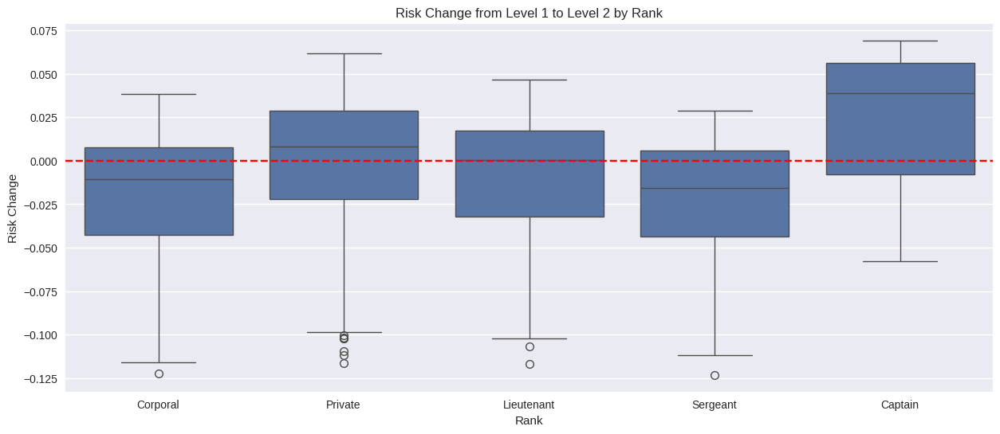

In [59]:
# 3. Risk Change from Level 1 to Level 2
df['risk_change_l1_l2'] = df['modified_risk'] - df['initial_risk']
plt.figure(figsize=(15, 6))
sns.boxplot(x='rank', y='risk_change_l1_l2', data=df)
plt.title('Risk Change from Level 1 to Level 2 by Rank')
plt.xlabel('Rank')
plt.ylabel('Risk Change')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

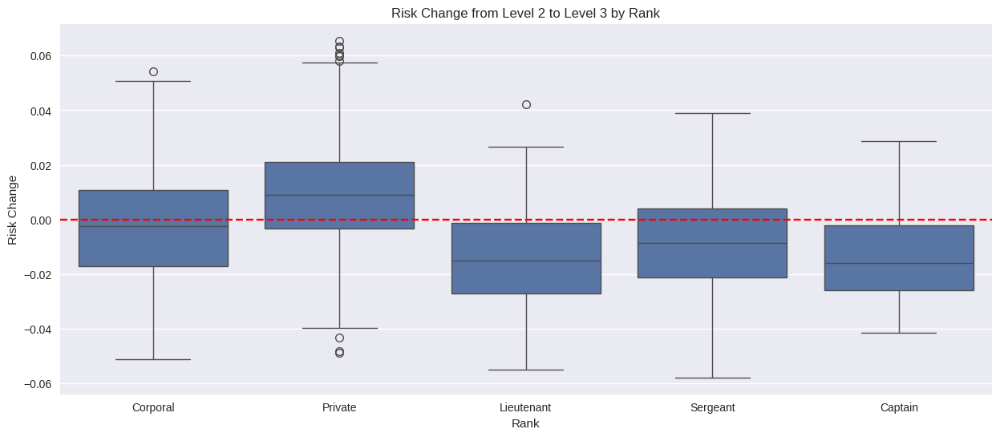

In [60]:

# 4. Risk Change from Level 2 to Level 3
df['risk_change_l2_l3'] = df['final_risk'] - df['modified_risk']
plt.figure(figsize=(15, 6))
sns.boxplot(x='rank', y='risk_change_l2_l3', data=df)
plt.title('Risk Change from Level 2 to Level 3 by Rank')
plt.xlabel('Rank')
plt.ylabel('Risk Change')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

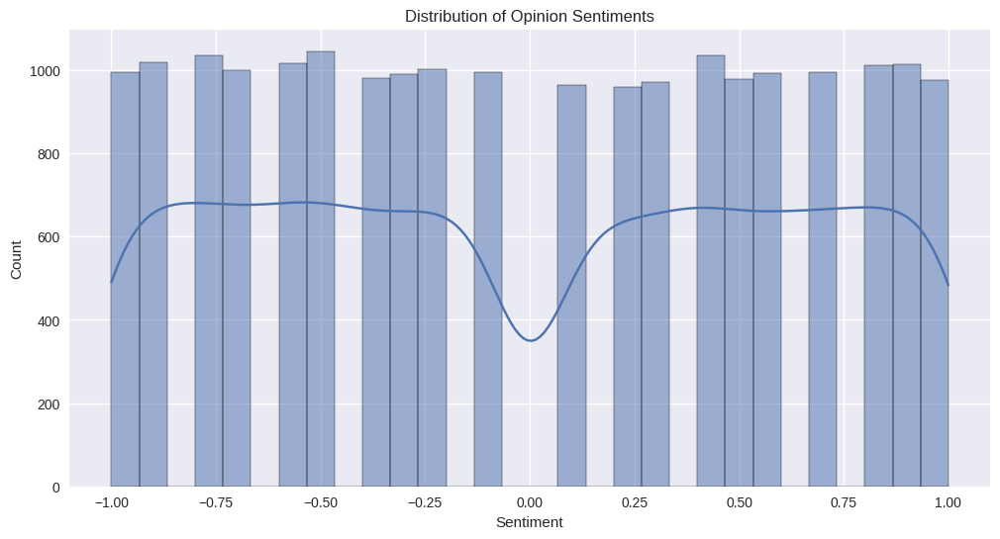

In [61]:
# 5. Opinion Sentiment Distribution
plt.figure(figsize=(12, 6))
sns.histplot(data=opinions_df, x='sentiment', kde=True, bins=30)
plt.title('Distribution of Opinion Sentiments')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.show()


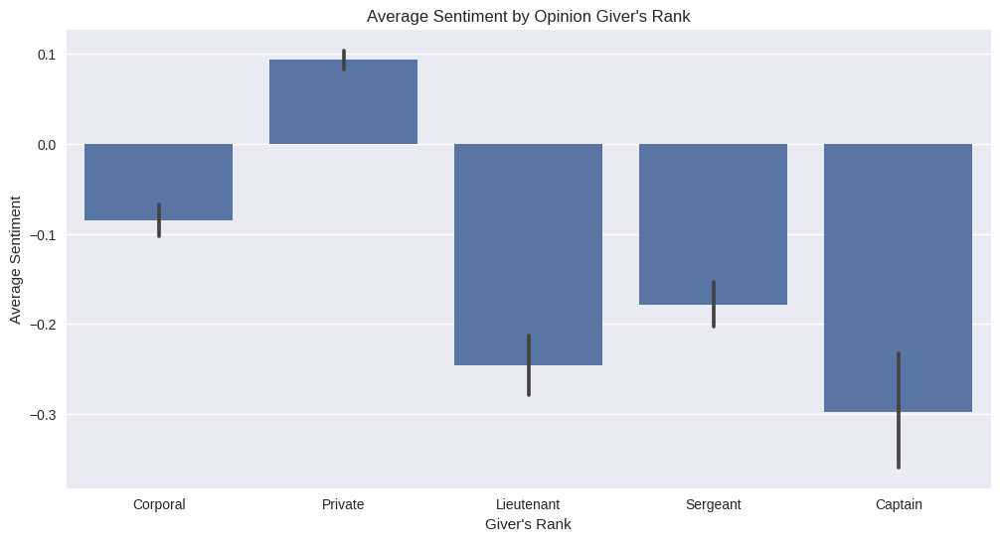

In [62]:
# 6. Average Sentiment by Giver's Rank
giver_ranks = df.set_index('soldier_id')['rank']
opinions_df['giver_rank'] = opinions_df['giver_id'].map(giver_ranks)
plt.figure(figsize=(12, 6))
sns.barplot(x='giver_rank', y='sentiment', data=opinions_df)
plt.title('Average Sentiment by Opinion Giver\'s Rank')
plt.xlabel('Giver\'s Rank')
plt.ylabel('Average Sentiment')
plt.show()

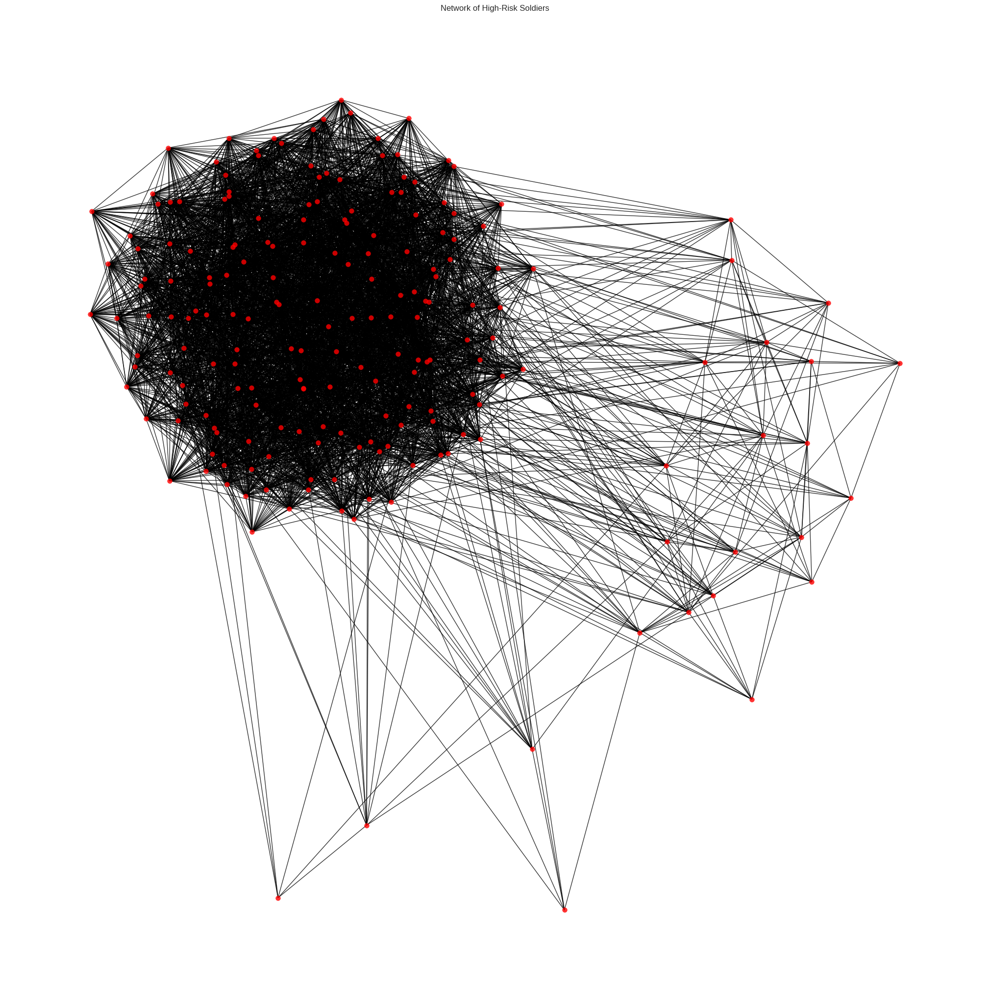

In [63]:
# 7. Network Visualization of High-Risk Soldiers
high_risk_threshold = df['final_risk'].quantile(0.9)
high_risk_soldiers = df[df['final_risk'] > high_risk_threshold]['soldier_id'].tolist()
high_risk_subgraph = friendship_network.subgraph(high_risk_soldiers)

plt.figure(figsize=(20, 20))
pos = nx.spring_layout(high_risk_subgraph)
nx.draw(high_risk_subgraph, pos, node_color='red', node_size=50, alpha=0.8)
plt.title('Network of High-Risk Soldiers')
plt.axis('off')
plt.show()


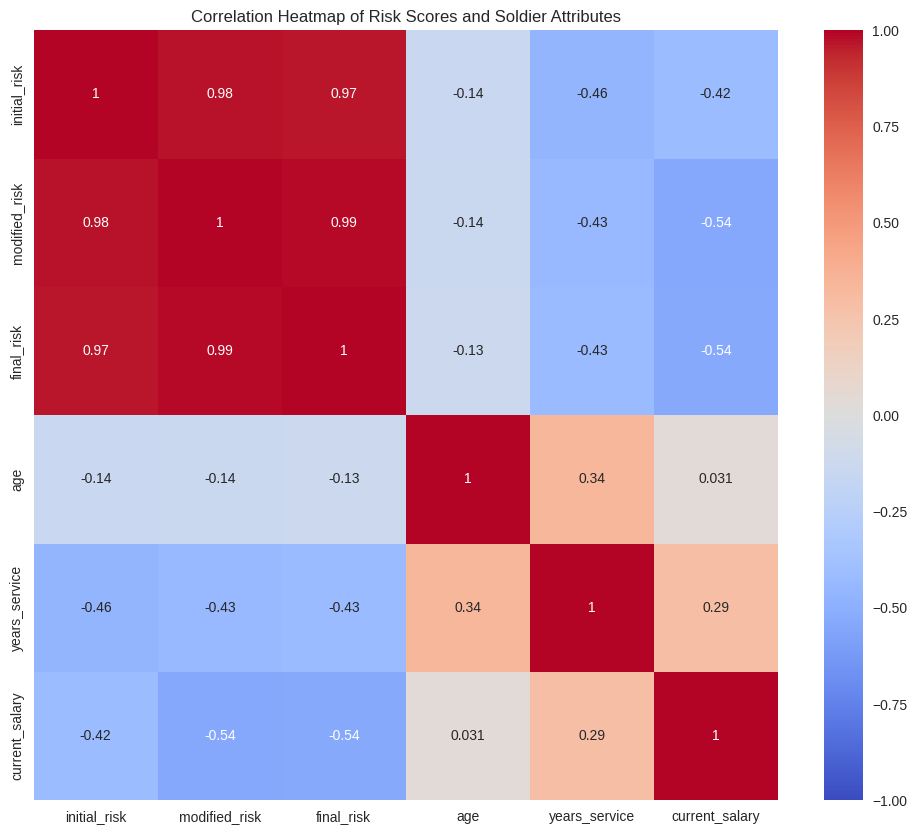

In [ ]:
# 8. Correlation Heatmap
correlation_columns = ['initial_risk', 'modified_risk', 'final_risk', 'age', 'years_service', 'current_salary']
correlation_matrix = df[correlation_columns].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Correlation Heatmap of Risk Scores and Soldier Attributes')
plt.show()

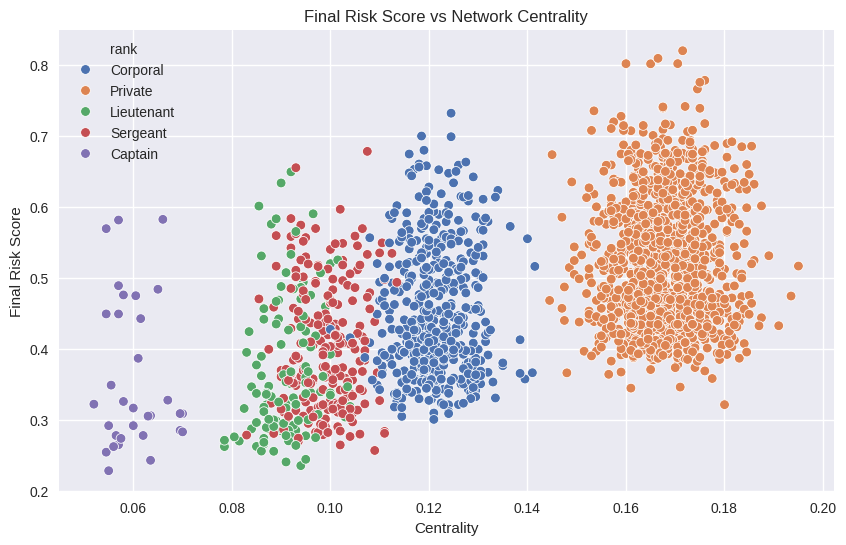

In [ ]:
# 9. Risk Score vs Network Centrality
centrality = nx.degree_centrality(friendship_network)
df['centrality'] = df['soldier_id'].map(centrality)

plt.figure(figsize=(10, 6))
sns.scatterplot(x='centrality', y='final_risk', hue='rank', data=df)
plt.title('Final Risk Score vs Network Centrality')
plt.xlabel('Centrality')
plt.ylabel('Final Risk Score')
plt.show()

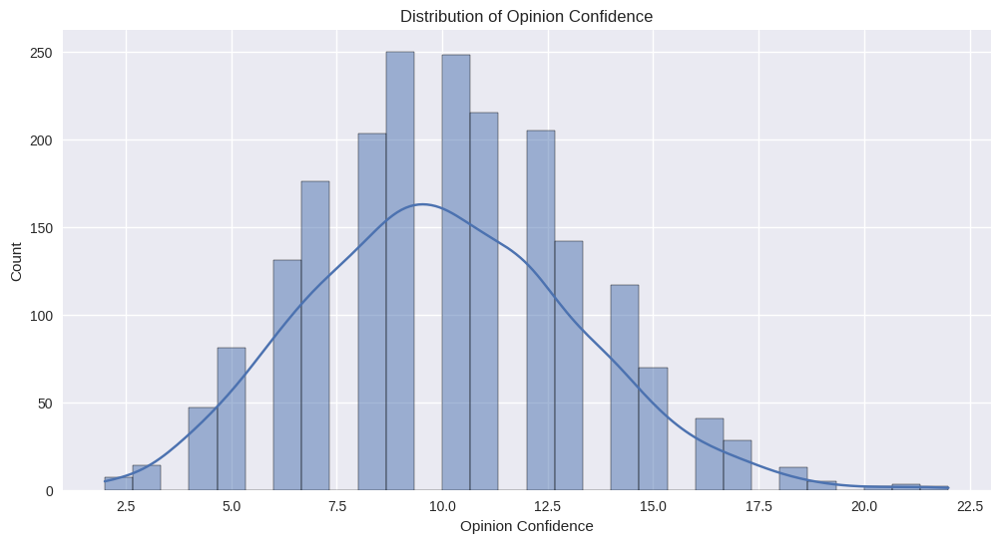

In [ ]:
# 10. Opinion Confidence Distribution
plt.figure(figsize=(12, 6))
sns.histplot(data=df, x='opinion_confidence', kde=True, bins=30)
plt.title('Distribution of Opinion Confidence')
plt.xlabel('Opinion Confidence')
plt.ylabel('Count')
plt.show()

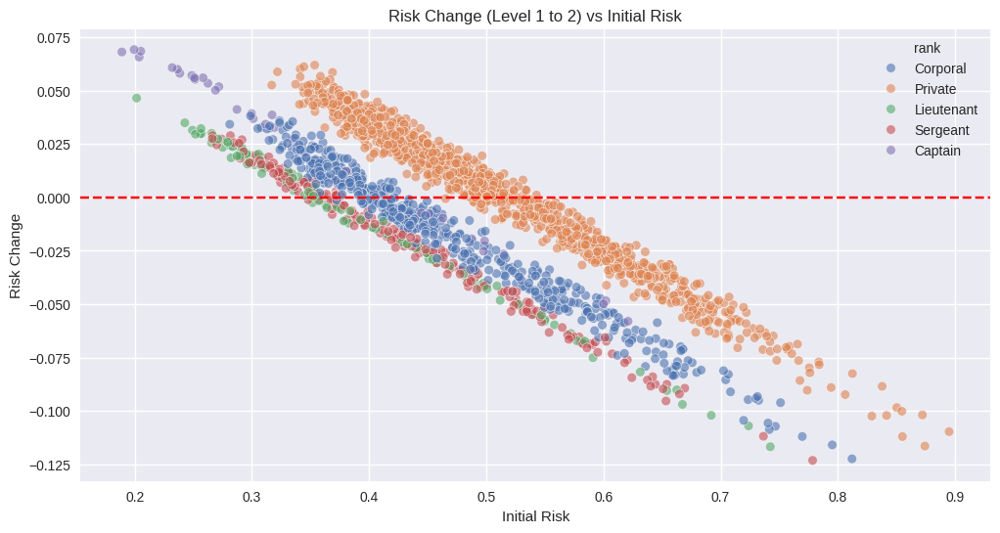

In [ ]:
# 11. Risk Change vs Initial Risk
plt.figure(figsize=(12, 6))
sns.scatterplot(x='initial_risk', y='risk_change_l1_l2', hue='rank', data=df, alpha=0.6)
plt.title('Risk Change (Level 1 to 2) vs Initial Risk')
plt.xlabel('Initial Risk')
plt.ylabel('Risk Change')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

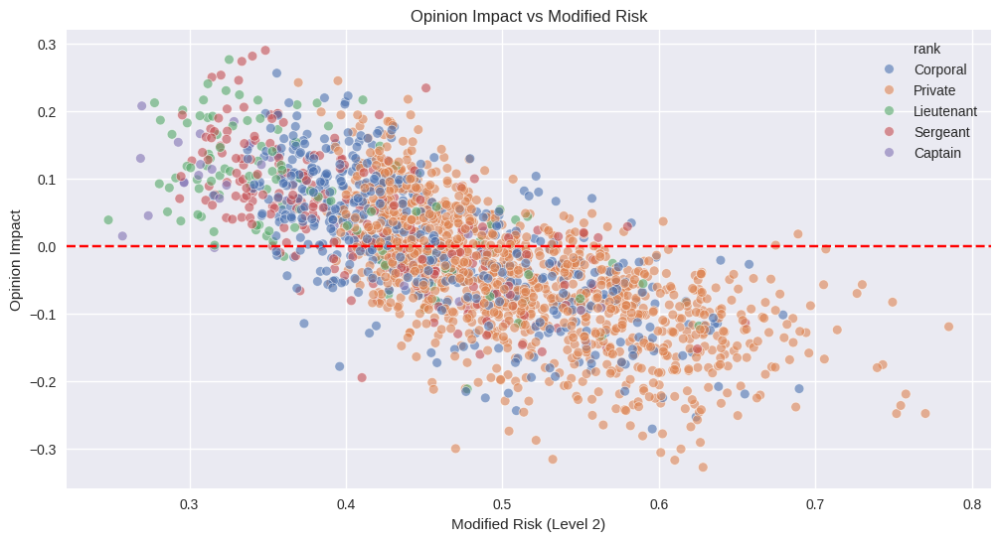

In [ ]:
# 12. Opinion Impact vs Modified Risk
plt.figure(figsize=(12, 6))
sns.scatterplot(x='modified_risk', y='opinion_impact', hue='rank', data=df, alpha=0.6)
plt.title('Opinion Impact vs Modified Risk')
plt.xlabel('Modified Risk (Level 2)')
plt.ylabel('Opinion Impact')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

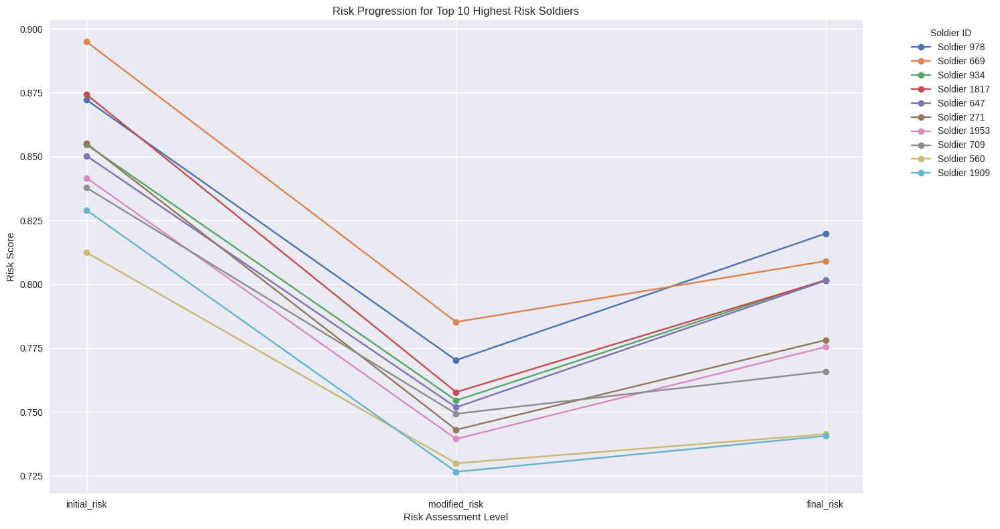

In [64]:
# 13. Risk Progression for Top 10 Highest Risk Soldiers
top_10_risky = df.nlargest(10, 'final_risk')
risk_levels = ['initial_risk', 'modified_risk', 'final_risk']

plt.figure(figsize=(15, 8))
for _, soldier in top_10_risky.iterrows():
    plt.plot(risk_levels, soldier[risk_levels], marker='o', label=f"Soldier {soldier['soldier_id']}")

plt.title('Risk Progression for Top 10 Highest Risk Soldiers')
plt.xlabel('Risk Assessment Level')
plt.ylabel('Risk Score')
plt.legend(title='Soldier ID', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

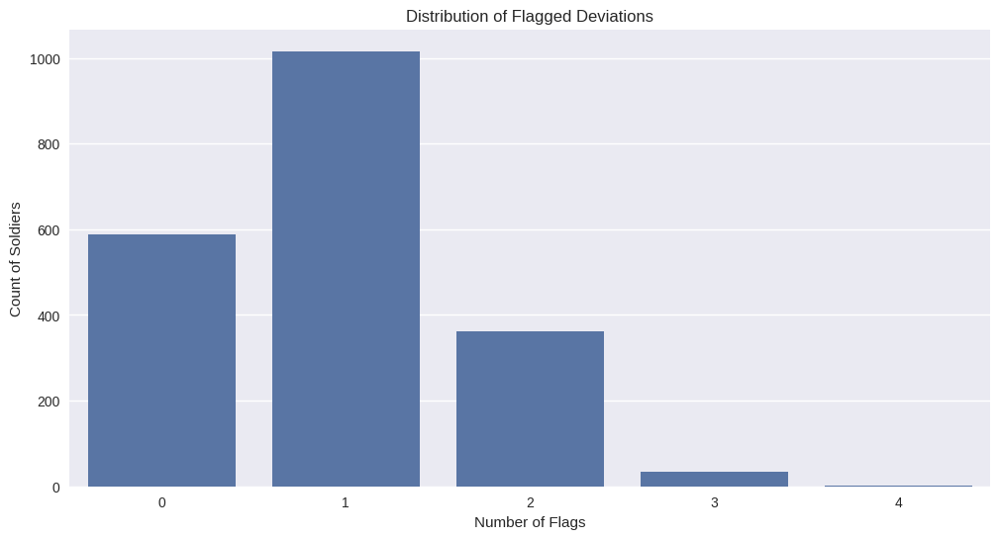

In [65]:
# 14. Distribution of Flagged Deviations
df['flag_count'] = df['risk_flags'].apply(lambda x: len(x) if isinstance(x, list) else 0)
plt.figure(figsize=(12, 6))
sns.countplot(x='flag_count', data=df)
plt.title('Distribution of Flagged Deviations')
plt.xlabel('Number of Flags')
plt.ylabel('Count of Soldiers')
plt.show()

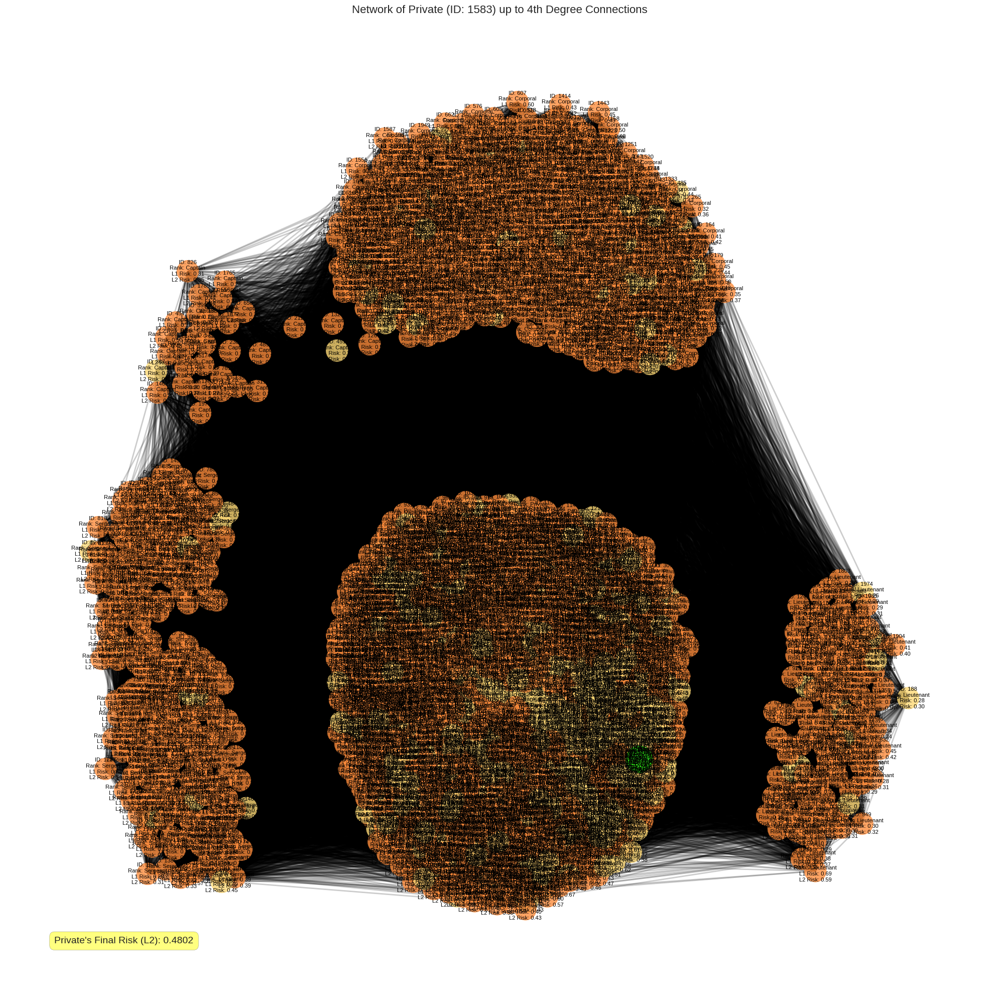

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import random

def visualize_private_network(df, G, k=4):
    # Randomly sample a private
    private = df[df['rank'] == 'Private'].sample(1).iloc[0]

    # Get subgraph of k-degree connections
    subgraph = nx.ego_graph(G, private['soldier_id'], radius=k)

    # Get node colors based on degree
    node_colors = []
    color_map = plt.cm.YlOrRd(np.linspace(0, 1, k+1))
    for node in subgraph.nodes():
        degree = nx.shortest_path_length(subgraph, private['soldier_id'], node)
        node_colors.append(color_map[degree])

    # Set up the plot
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(subgraph, k=0.5, iterations=50)

    # Draw edges
    nx.draw_networkx_edges(subgraph, pos, alpha=0.2, width=2)

    # Draw nodes
    nx.draw_networkx_nodes(subgraph, pos, node_color=node_colors, node_size=1000, alpha=0.8)

    # Add labels
    labels = {}
    for node in subgraph.nodes():
        soldier = df[df['soldier_id'] == node].iloc[0]
        labels[node] = f"ID: {soldier['soldier_id']}\nRank: {soldier['rank']}\nL1 Risk: {soldier['initial_risk']:.2f}\nL2 Risk: {soldier['modified_risk']:.2f}"

    nx.draw_networkx_labels(subgraph, pos, labels, font_size=8)

    # Highlight the sampled private
    nx.draw_networkx_nodes(subgraph, pos, nodelist=[private['soldier_id']],
                           node_color='lime', node_size=1500, alpha=0.8)

    # Add title and adjust layout
    plt.title(f"Network of Private (ID: {private['soldier_id']}) up to {k}th Degree Connections", fontsize=16)
    plt.axis('off')
    plt.tight_layout()

    # Add text box with private's final risk
    plt.text(0.05, 0.05, f"Private's Final Risk (L2): {private['modified_risk']:.4f}",
             transform=plt.gca().transAxes, fontsize=14,
             verticalalignment='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))

    plt.show()

# Assuming df is your DataFrame and G is your NetworkX graph
visualize_private_network(df, friendship_network, k=4)

<ipython-input-50-a809e54fe22c>:24: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sampled_nodes.update(random.sample(cluster, cluster_size))


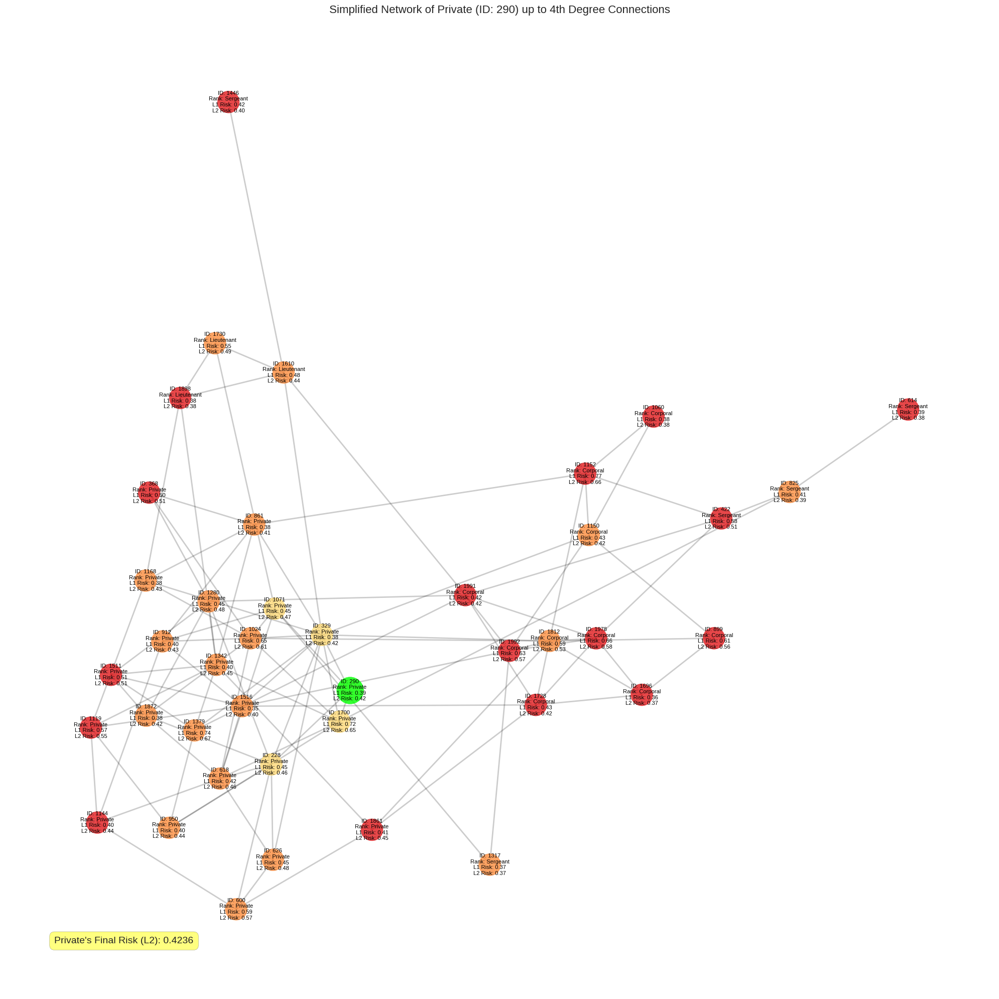

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import random

def visualize_private_network_simplified(df, G, k=4, max_nodes=40):
    # Randomly sample a private
    private = df[df['rank'] == 'Private'].sample(1).iloc[0]

    # Get subgraph of k-degree connections
    full_subgraph = nx.ego_graph(G, private['soldier_id'], radius=k)

    # Identify clusters in the full subgraph
    clusters = list(nx.connected_components(full_subgraph))

    # Calculate the proportion of nodes to keep from each cluster
    total_nodes = sum(len(cluster) for cluster in clusters)
    keep_ratio = min(1.0, max_nodes / total_nodes)

    # Sample nodes from each cluster
    sampled_nodes = set([private['soldier_id']])  # Always include the central private
    for cluster in clusters:
        cluster_size = max(1, int(len(cluster) * keep_ratio))
        sampled_nodes.update(random.sample(cluster, cluster_size))

    # Create a new subgraph with only the sampled nodes
    subgraph = full_subgraph.subgraph(sampled_nodes)

    # Get node colors based on degree
    node_colors = []
    color_map = plt.cm.YlOrRd(np.linspace(0, 1, k+1))
    for node in subgraph.nodes():
        degree = nx.shortest_path_length(subgraph, private['soldier_id'], node)
        node_colors.append(color_map[degree])

    # Set up the plot
    plt.figure(figsize=(20, 20))
    pos = nx.spring_layout(subgraph, k=0.5, iterations=50)

    # Draw edges
    nx.draw_networkx_edges(subgraph, pos, alpha=0.2, width=2)

    # Draw nodes
    nx.draw_networkx_nodes(subgraph, pos, node_color=node_colors, node_size=1000, alpha=0.8)

    # Add labels
    labels = {}
    for node in subgraph.nodes():
        soldier = df[df['soldier_id'] == node].iloc[0]
        labels[node] = f"ID: {soldier['soldier_id']}\nRank: {soldier['rank']}\nL1 Risk: {soldier['initial_risk']:.2f}\nL2 Risk: {soldier['modified_risk']:.2f}"

    nx.draw_networkx_labels(subgraph, pos, labels, font_size=8)

    # Highlight the sampled private
    nx.draw_networkx_nodes(subgraph, pos, nodelist=[private['soldier_id']],
                           node_color='lime', node_size=1500, alpha=0.8)

    # Add title and adjust layout
    plt.title(f"Simplified Network of Private (ID: {private['soldier_id']}) up to {k}th Degree Connections", fontsize=16)
    plt.axis('off')
    plt.tight_layout()

    # Add text box with private's final risk
    plt.text(0.05, 0.05, f"Private's Final Risk (L2): {private['modified_risk']:.4f}",
             transform=plt.gca().transAxes, fontsize=14,
             verticalalignment='bottom', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))

    plt.show()

# Assuming df is your DataFrame and G is your NetworkX graph
visualize_private_network_simplified(df, friendship_network, k=4, max_nodes=40)

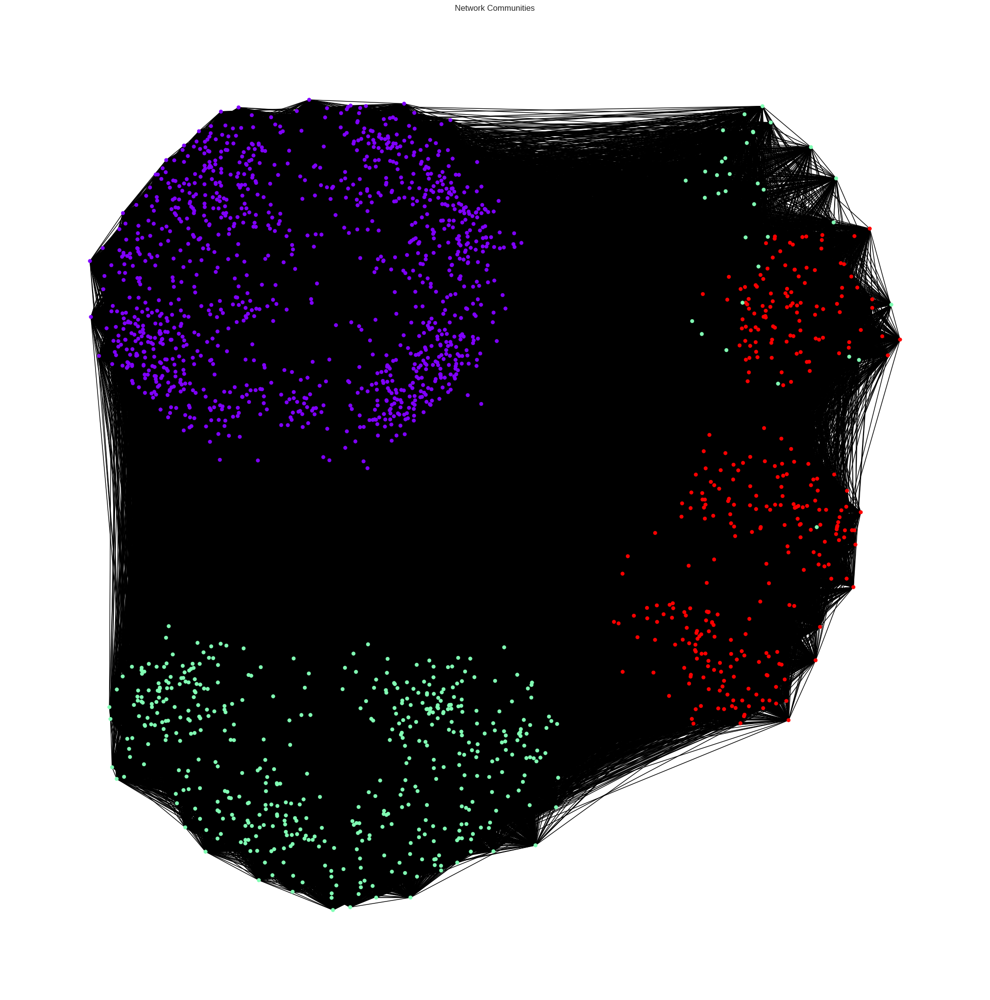

In [66]:
# 15. Network Community Detection and Visualization
communities = list(nx.community.greedy_modularity_communities(friendship_network))
community_map = {}
for i, community in enumerate(communities):
    for node in community:
        community_map[node] = i

df['community'] = df['soldier_id'].map(community_map)

plt.figure(figsize=(20, 20))
pos = nx.spring_layout(friendship_network)
nx.draw(friendship_network, pos, node_color=[community_map.get(node, 0) for node in friendship_network.nodes()],
        node_size=30, cmap=plt.cm.rainbow)
plt.title('Network Communities')
plt.axis('off')
plt.show()

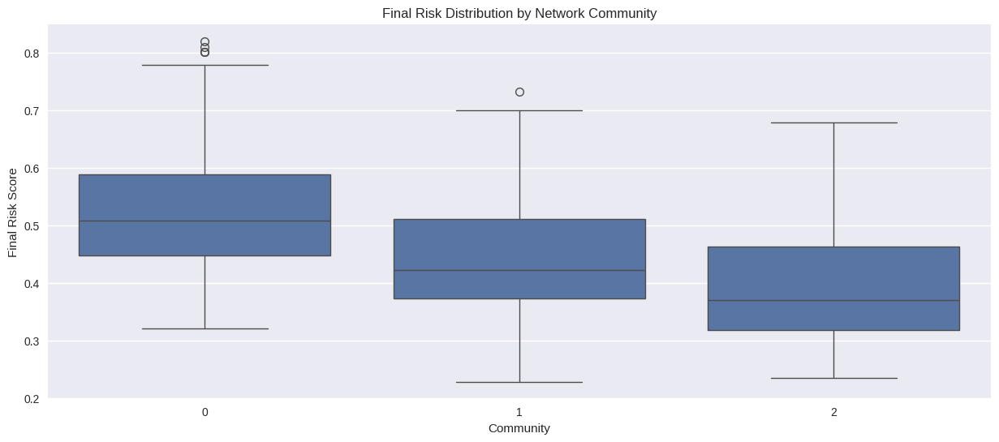

In [67]:
# 16. Risk Distribution by Community
plt.figure(figsize=(15, 6))
sns.boxplot(x='community', y='final_risk', data=df)
plt.title('Final Risk Distribution by Network Community')
plt.xlabel('Community')
plt.ylabel('Final Risk Score')
plt.show()

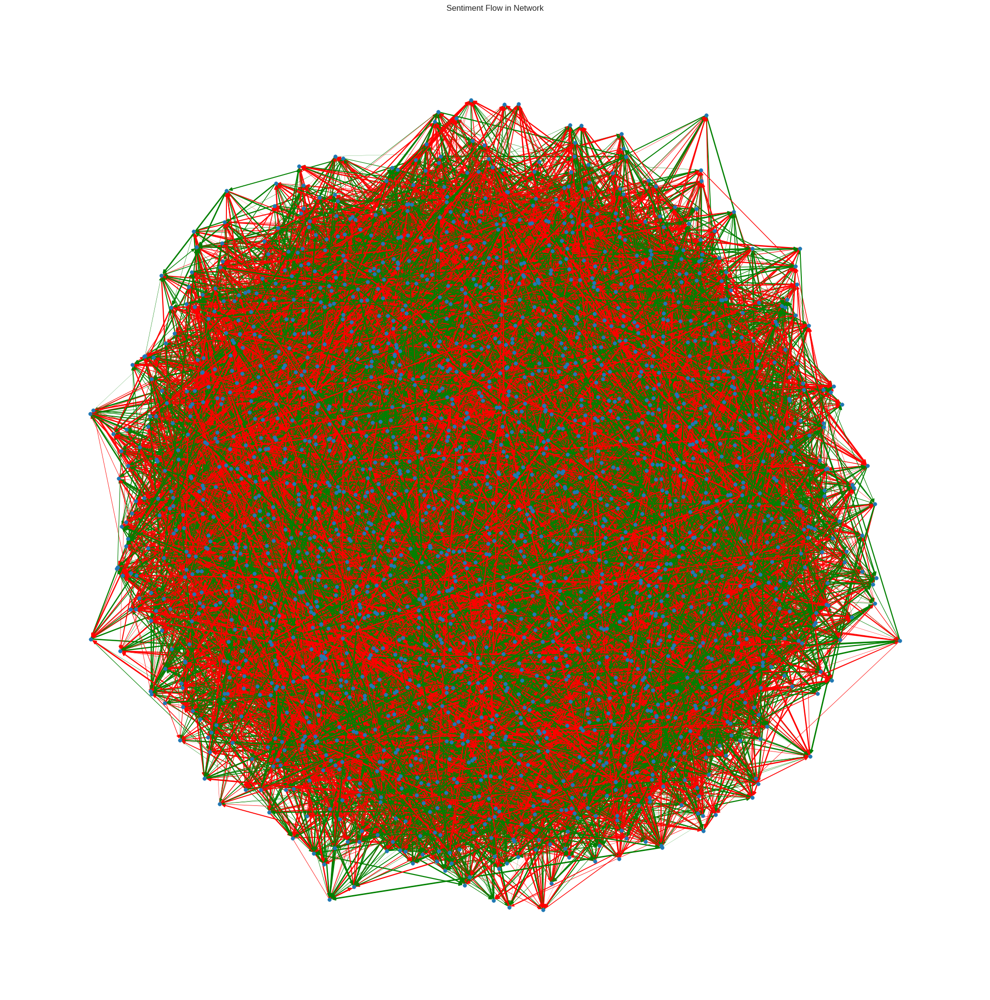

In [ ]:
# 17. Sentiment Flow in Network
# Create a directed graph of positive and negative sentiments
sentiment_graph = nx.DiGraph()
for _, opinion in opinions_df.iterrows():
    sentiment_graph.add_edge(opinion['giver_id'], opinion['receiver_id'],
                             sentiment=opinion['sentiment'],
                             color='green' if opinion['sentiment'] > 0 else 'red')

plt.figure(figsize=(20, 20))
pos = nx.spring_layout(sentiment_graph)
edges = sentiment_graph.edges()
colors = [sentiment_graph[u][v]['color'] for u,v in edges]
weights = [abs(sentiment_graph[u][v]['sentiment'])*2 for u,v in edges]

nx.draw(sentiment_graph, pos, edge_color=colors, width=weights, node_size=30, arrows=True)
plt.title('Sentiment Flow in Network')
plt.axis('off')
plt.show()

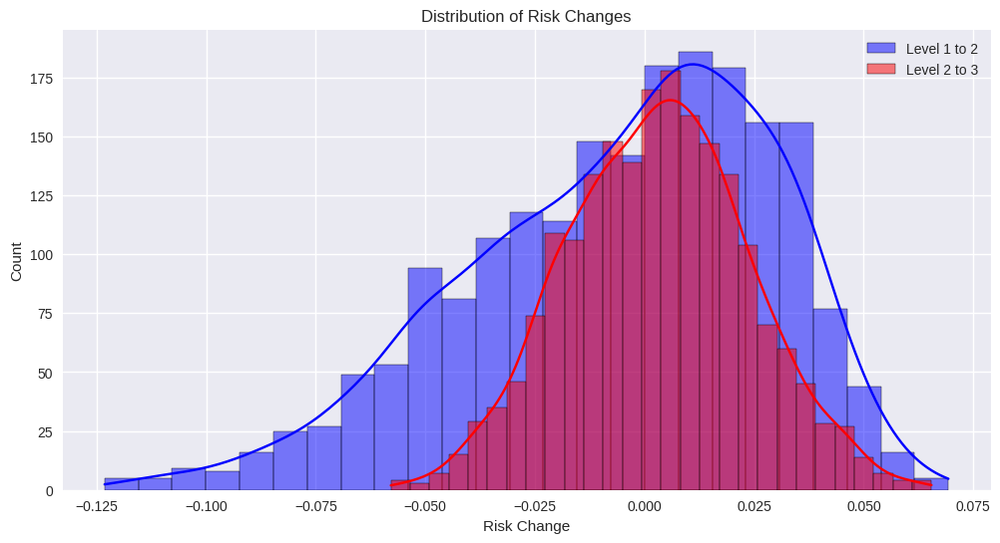

In [ ]:
# 18. Risk Change Distribution
plt.figure(figsize=(12, 6))
sns.histplot(data=df, x='risk_change_l1_l2', kde=True, color='blue', label='Level 1 to 2', alpha=0.5)
sns.histplot(data=df, x='risk_change_l2_l3', kde=True, color='red', label='Level 2 to 3', alpha=0.5)
plt.title('Distribution of Risk Changes')
plt.xlabel('Risk Change')
plt.ylabel('Count')
plt.legend()
plt.show()

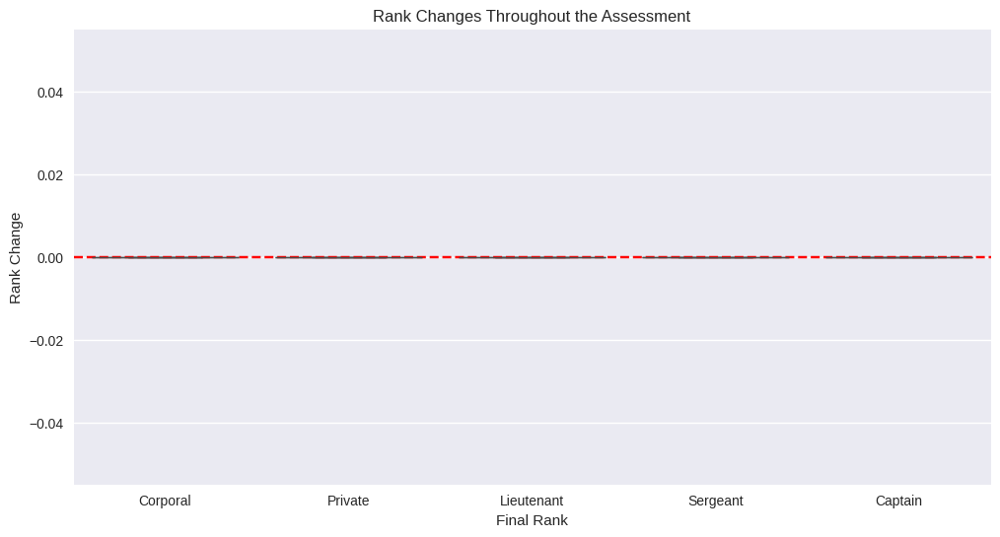

In [ ]:
# 19. Rank Transition Analysis
rank_order = ['Private', 'Corporal', 'Sergeant', 'Lieutenant', 'Captain']
df['rank_numeric'] = df['rank'].apply(lambda x: rank_order.index(x))
df['rank_change'] = df['rank_numeric'] - df.groupby('soldier_id')['rank_numeric'].transform('first')

plt.figure(figsize=(12, 6))
sns.boxplot(x='rank', y='rank_change', data=df)
plt.title('Rank Changes Throughout the Assessment')
plt.xlabel('Final Rank')
plt.ylabel('Rank Change')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

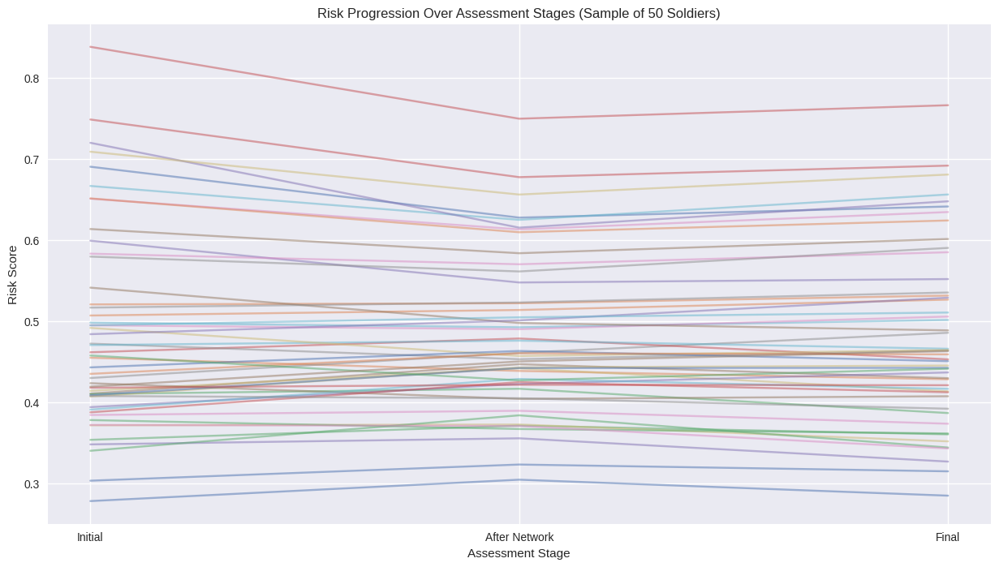

In [ ]:
# 20. Time Series of Risk (assuming assessments were done over time)
# This is a simulated time series since we don't have actual time data
time_points = ['Initial', 'After Network', 'Final']
plt.figure(figsize=(15, 8))
for _, soldier in df.sample(n=50).iterrows():
    plt.plot(time_points, [soldier['initial_risk'], soldier['modified_risk'], soldier['final_risk']], alpha=0.5)
plt.title('Risk Progression Over Assessment Stages (Sample of 50 Soldiers)')
plt.xlabel('Assessment Stage')
plt.ylabel('Risk Score')
plt.show()